<a href="https://colab.research.google.com/github/JMCRMatheusCastro/nonlinear-rc-column-impact/blob/main/ColImpact.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ColImpact  (Column Impact Analysis Tool)**

**Programador:** José Matheus de Castro Rodrigues.

**Última versão:** 12/12/2025

_Recife / PE, Brasil._

---


Este código foi desenvolvido para analisar o comportamento não linear de pilares de concreto armado sujeitos a carregamentos laterais, incluindo os efeitos de impacto de veículos atráves de Forças Estáticas Equivalentes (FEE).

---

Referências:

*   ARAÚJO, J. M. **Curso de Concreto Armado:** Volume 1. 4. ed. Rio Grande: Dunas, 2014.
*   ARAÚJO, J. M. **Curso de Concreto Armado:** Volume 3. 4. ed. Rio Grande: Dunas, 2014.
*   ASSOCIAÇÃO BRASILEIRA DE NORMAS TÉCNICAS. **ABNT NBR 6118:** Projeto de estruturas de concreto. Rio de Janeiro: ABNT, 2023.
*   FERREIRA, P. F. S. **Estacas de Seção Circular Semienterradas Submetidas a Cargas Laterais**. 2022. Dissertação (Mestrado em Engenharia Civil), Programa de Pós-Graduação em Engenharia Civil, Universidade Federal de Pernambuco, Recife, 2017.
*   GHALI, A.; NEVILE, A. **Structural Analysis:** A unified classical and matrix approach. 7. ed. Boca Raton: CRC Press, 2017.
*   ZIENKIEWICZ, O. C.; MORGAN, K. **Finite Elements and Approximation**. 1. ed. New York: Dover Publications, 2006.

# **0. BIBLIOTECAS**

In [1]:
import numpy as np                      # A biblioteca NumPy facilita operações matemáticas
                                        # avançadas e manipulação eficiente de
                                        # arrays/matrizes multidimensionais.

import matplotlib.pyplot as plt         # A biblioteca Matplotlib (pyplot) é usada para
                                        # criar gráficos, visualizações e plots de dados.

from scipy.sparse import lil_matrix     # A função lil_matrix é usada para criar matrizes
                                        # esparsas.

from scipy.sparse.linalg import spsolve # A função spsolve é usada para resolver sistemas
                                        # de equações lineares esparsos.

from scipy.interpolate import interp1d  # Esta função do SciPy é usada para interpolação
                                        # unidimensional. Ela permite criar uma função que
                                        # interpola dados de um conjunto discreto de pontos, útil
                                        # para estimar valores entre pontos de dados conhecidos.

from scipy.optimize import fsolve       # A função fsolve é usada para encontrar a raiz (zero)
                                        # de uma função não linear, resolvendo equações ou
                                        # sistemas de equações de forma iterativa.

import scipy.integrate as integrate     # Este módulo do SciPy oferece várias técnicas para
                                        # integração numérica, como a regra do trapézio,
                                        # utilizada para calcular a área sob uma curva.

import sys                              # O módulo sys fornece acesso a variáveis e funções que
                                        # interagem fortemente com o interpretador Python. É
                                        # frequentemente usado para manipular o ambiente de tempo
                                        # de execução, como acessar argumentos de linha de comando
                                        # ou sair do script.

import re                               # Este módulo implementa operações com expressões regulares.
                                        # É útil para buscar, substituir e manipular strings com
                                        #  base em padrões complexos.

import pandas as pd                     # A biblioteca Pandas é fundamental para manipulação e
                                        # análise de dados, oferecendo estruturas como DataFrames p/
                                        # processar tabelas e séries temporais de forma eficiente.

# **1. DADOS DE ENTRADA**

## **1.1 Seção Retangular**

### EX. 1 - Pilar Biapoiado - 50kN - Araújo, 2024

In [31]:
# Geometria
b,h,L = 0.5,0.2,2.8                                  #(m)

# Armadura
dLinha = 0.05                                        #(m)
n = np.array([4,4])                                  #(adim)
nLinha = len(n)                                      #(adim)
ds = np.linspace(-h/2 +dLinha, h/2 -dLinha, nLinha)  #(m)
bitola = 16                                          #(mm)

# Discretização da seção longitudinal
DeltaZ = 0.01                                        #(m)
nNos = int(L/DeltaZ + 1)                             #(adim)

# Materiais
fck = 25000                                          #(kN/m²)
fcd = fck/1.4                                        #(kN/m²)
fyk = 500000                                         #(kN/m²)
fyd = fyk/1.15                                       #(kN/m²)
Es = 200000000                                       #(kN/m²)

### DEFORMAÇÕES LIMITES PARA O CONCRETO
ε0 = 0.002                                           #(2.0 ‰)
εu = 0.0035                                          #(3.5 ‰)
k = 1-(ε0/εu)                                        #(adim)

'DEFINIÇÃO DOS CARREGAMENTOS'
# Nd:    (+) para compressão;
# qd:     (+) para direita;
# MBd:    (+) no sentido horário;
# MTd:    (+) no sentido anti-horário.
# Fveic: (+) para direita;

Nd = 1171                                            #(kN) - (Força Normal de Cálculo)
qd =  0                                               #(kN/m) - (Carregamento Distribuído de Cálculo)
MBd = 0                                               #(kN.m) - (Momento Fletor de Cálculo - Base)
MTd = 28.69                                           #(kN.m) - (Momento Fletor de Cálculo - Topo)
Fveic = 50                                           #(kN) - (Força do impacto do veículo no pilar)
Pos_Fveic = 0.5                                      #(m) - (posição do impacto ao longo do pilar)


'DADOS DO TQS PARA O DIAGRAMA N, M e 1/r'

χ_TQS_rec_85 = np.array([-0.000023018991667456324, 0.0012476108220246891, 0.0025876681377480556,
                         0.003881455890743477, 0.005198216319527748, 0.006445734509795225,
                         0.007739290683397612, 0.009009735233575332, 0.010325939871816325,
                         0.011618801307239615, 0.012934542786694541, 0.01422703369508898,
                         0.015519431971726207, 0.01678867230906015, 0.018081024269818773,
                         0.01939634890636624, 0.020665450296064366, 0.02195775594094438,
                         0.02299611162342467])

M_TQS_rec_85 = np.array([-0.00010765977093285528, 4.723895428895148, 9.984367156108682,
                         14.92293616823956, 19.647154576447505, 24.26382087349573,
                         28.66624422639196, 32.96133078767033, 36.39879961371512,
                         39.19278598890741, 41.5579634964829, 43.494116816899755,
                         45.21581187362274, 46.722941006880944, 48.337406931757,
                         49.737522252710136, 50.92296399042755, 52.43020078345668,
                         53.40010765977092])

χ_TQS_rec_11 = np.array([0, 0.0006242454118591068, 0.0012948067023247657, 0.0019421174217299354,
                         0.002589428141135105, 0.0032137661847514245, 0.003837918964853319,
                         0.004531452931107827, 0.005155698342966933, 0.005803009062372104,
                         0.00647319982580891, 0.007097074710639164, 0.0077438759553796616,
                         0.008413696191787615, 0.009037293181346231, 0.009706974470118365,
                         0.010307274572737885, 0.01120770156872786])

M_TQS_rec_11 = np.array([-0.10722913184693539, 3.3270099010699425, 7.190380780916392,
                         10.624727473604203, 14.059074166292007, 17.70777146290274,
                         20.927552232125755, 24.57657250804928, 28.010811540966152,
                         31.445158233653952, 34.45069605872497, 37.02710203686641,
                         39.28192827923799, 41.429633049533564, 43.36266423659343,
                         45.18868161134822, 46.5854594794025, 48.62701171556046])


'DADOS DO MIDAS GEN PARA O DESLOCAMENTO'

W_SOLUCANALIT = np.array([
0.000e+00, 3.822e-04, 7.579e-04, 1.121e-03, 1.465e-03, 1.783e-03,
 2.071e-03, 2.326e-03, 2.550e-03, 2.741e-03, 2.899e-03, 3.025e-03,
 3.118e-03, 3.177e-03, 3.204e-03, 3.197e-03, 3.157e-03, 3.083e-03,
 2.975e-03, 2.834e-03, 2.658e-03, 2.447e-03, 2.203e-03, 1.923e-03,
 1.609e-03, 1.259e-03, 8.750e-04, 4.553e-04, 0.000e+00
])


W_MIDASGEN = np.array([
    0.0000000000, 0.0003870000, 0.0007680000, 0.0011350000, 0.0014840000,
    0.0018070000, 0.0020940000, 0.0023480000, 0.0025700000, 0.0027600000,
    0.0029180000, 0.0030420000, 0.0031340000, 0.0031930000, 0.0032180000,
    0.0032100000, 0.0031690000, 0.0030940000, 0.0029850000, 0.0028430000,
    0.0026660000, 0.0024540000, 0.0022080000, 0.0019280000, 0.0016130000,
    0.0012620000, 0.0008770000, 0.0004560000, 0.0000000000
])

W_MIDASGEN_NLG = np.array([
 0.0000000000, 0.0004120000, 0.0008180000, 0.0012100000, 0.0015830000,
    0.0019280000, 0.0022360000, 0.0025100000, 0.0027500000, 0.0029550000,
    0.0031260000, 0.0032620000, 0.0033620000, 0.0034260000, 0.0034550000,
    0.0034470000, 0.0034030000, 0.0033220000, 0.0032040000, 0.0030500000,
    0.0028580000, 0.0026300000, 0.0023640000, 0.0020620000, 0.0017220000,
    0.0013460000, 0.0009340000, 0.0004850000, 0.0000000000
])

'DADOS DO MIDAS GEN PARA O MOMENTO FLETOR'

M_SOLUCANALIT = np.array([
    0.00, 5.13, 10.26, 15.40, 20.53, 25.66, 25.79,
    25.92, 26.05, 26.19, 26.32, 26.45, 26.58, 26.71,
    26.84, 26.98, 27.11, 27.24, 27.37, 27.50, 27.64,
    27.77, 27.90, 28.03, 28.16, 28.29, 28.43, 28.56,
    28.69
])

M_MIDASGEN = np.array([ 0.00,  -5.13, -10.26, -15.40, -20.53, -25.66, -25.79, -25.92,
                         -26.05, -26.19, -26.32, -26.45, -26.58, -26.71, -26.85, -26.98,
                         -27.11, -27.24, -27.37, -27.50, -27.64, -27.77, -27.90, -28.03,
                         -28.16, -28.29, -28.43, -28.56, -28.69
                            ])*-1

M_MIDASGEN_NLG = np.array([ -0.00,  -5.36, -10.71, -16.06, -21.41, -26.74, -27.07, -27.39,
                                -27.70, -27.99, -28.26, -28.52, -28.76, -28.97, -29.17, -29.34,
                                -29.48, -29.60, -29.69, -29.74, -29.77, -29.76, -29.72, -29.65,
                                -29.53, -29.38, -29.19, -28.96, -28.69   ])*-1

### EX. 2 - Pilar Biapoiado - 100kN - Cappellari, 2023

In [ ]:
# Geometria
b,h,L = 0.3,0.19,3.5                                 #(m)

# Armadura
dLinha = 0.0505                                      #(m)
n = np.array([3,3])                                  #(adim)
nLinha = len(n)                                      #(adim)
ds = np.linspace(-h/2 +dLinha, h/2 -dLinha, nLinha)  #(m)
bitola = 25                                          #(mm)

# Discretização da seção longitudinal
DeltaZ = 0.10                                        #(m)
nNos = int(L/DeltaZ + 1)                             #(adim)

# Materiais
fck = 25000                                          #(kN/m²)
fcd = fck/1.4                                        #(kN/m²)
fyk = 500000                                         #(kN/m²)
fyd = fyk/1.15                                       #(kN/m²)
Es = 210000000                                       #(kN/m²)

### DEFORMAÇÕES LIMITES PARA O CONCRETO
ε0 = 0.002                                           #(2.0 ‰)
εu = 0.0035                                          #(3.5 ‰)
k = 1-(ε0/εu)                                        #(adim)

'DEFINIÇÃO DOS CARREGAMENTOS'
# Nd:     (+) para compressão;
# qd:     (+) para direita;
# MBd:    (+) no sentido horário;
# MTd:    (+) no sentido anti-horário;
# Fveic:  (+) para direita.

Nd = 318.2                                           #(kN)   - (Força Normal de Cálculo)
qd =  0                                              #(kN/m) - (Carregamento Distribuído de Cálculo)
MBd = 0                                              #(kN.m) - (Momento Fletor de Cálculo - Base)
MTd = 0                                              #(kN.m) - (Momento Fletor de Cálculo - Topo)
Fveic = 100                                          #(kN)   - (Força do impacto do veículo no pilar)
Pos_Fveic = 0.5                                      #(m)    - (posição do impacto ao longo do pilar)

'DADOS DO TQS PARA O MOMENTO FLETOR'
M_TQS_PP1r = np.array([ 0.0, 53.1, 0])

M_TQS_Pdelta = np.array([0.0, 32.9, 30.4, 27.5, 24.2, 20.5, 16.6, 12.6, 8.4, 4.2, 0])

### EX. 3 - Pilar Biapoiado - 50kN - Cappellari, 2023

In [ ]:
# Geometria
b,h,L = 0.19,0.3,3.5                                 #(m)

# Armadura
dLinha = 0.0505                                      #(m)
n = np.array([2,2,2])                                  #(adim)
nLinha = len(n)                                      #(adim)
ds = np.linspace(-h/2 +dLinha, h/2 -dLinha, nLinha)  #(m)
bitola = 25                                          #(mm)

# Discretização da seção longitudinal
DeltaZ = 0.10                                        #(m)
nNos = int(L/DeltaZ + 1)                             #(adim)

# Materiais
fck = 25000                                          #(kN/m²)
fcd = fck/1.4                                        #(kN/m²)
fyk = 500000                                         #(kN/m²)
fyd = fyk/1.15                                       #(kN/m²)
Es = 210000000                                       #(kN/m²)

### DEFORMAÇÕES LIMITES PARA O CONCRETO
ε0 = 0.002                                           #(2.0 ‰)
εu = 0.0035                                          #(3.5 ‰)
k = 1-(ε0/εu)                                        #(adim)

'DEFINIÇÃO DOS CARREGAMENTOS'
# Nd:     (+) para compressão;
# qd:     (+) para direita;
# MBd:    (+) no sentido horário;
# MTd:    (+) no sentido anti-horário;
# Fveic:  (+) para direita.

Nd = 318.2                                           #(kN)   - (Força Normal de Cálculo)
qd =  0                                              #(kN/m) - (Carregamento Distribuído de Cálculo)
MBd = 0                                              #(kN.m) - (Momento Fletor de Cálculo - Base)
MTd = 0                                              #(kN.m) - (Momento Fletor de Cálculo - Topo)
Fveic = 50                                           #(kN)   - (Força do impacto do veículo no pilar)
Pos_Fveic = 0.5                                      #(m)    - (posição do impacto ao longo do pilar)

'DADOS DO TQS PARA O MOMENTO FLETOR'
M_TQS_PP1r = np.array([ 0.0, 27.9, 0])

M_TQS_Pdelta = np.array([0.0, 16.3,15,13.5,11.8,10.1,8.3,6.3,4.3,2.2, 0])

### EX. 4 - Pilar Biapoiado - 100kN - Edifício Proposto

In [ ]:
# Geometria
b,h,L = 0.3,0.3,3.4                                 #(m)

# Armadura
dLinha = 0.0413                                      #(m)
n = np.array([2,2])                                  #(adim)
nLinha = len(n)                                      #(adim)
ds = np.linspace(-h/2 +dLinha, h/2 -dLinha, nLinha)  #(m)
bitola = 20                                          #(mm)

# Discretização da seção longitudinal
DeltaZ = 0.10                                        #(m)
nNos = int(L/DeltaZ + 1)                             #(adim)

# Materiais
fck = 30000                                          #(kN/m²)
fcd = fck/1.4                                        #(kN/m²)
fyk = 500000                                         #(kN/m²)
fyd = fyk/1.15                                       #(kN/m²)
Es = 210000000                                       #(kN/m²)

### DEFORMAÇÕES LIMITES PARA O CONCRETO
ε0 = 0.002                                           #(2.0 ‰)
εu = 0.0035                                          #(3.5 ‰)
k = 1-(ε0/εu)                                        #(adim)

'DEFINIÇÃO DOS CARREGAMENTOS'
# Nd:     (+) para compressão;
# qd:     (+) para direita;
# MBd:    (+) no sentido horário;
# MTd:    (+) no sentido anti-horário;
# Fveic:  (+) para direita.

Nd = 1127.9                                          #(kN)   - (Força Normal de Cálculo)
qd =  0                                              #(kN/m) - (Carregamento Distribuído de Cálculo)
MBd = 0                                              #(kN.m) - (Momento Fletor de Cálculo - Base)
MTd = 0                                              #(kN.m) - (Momento Fletor de Cálculo - Topo)
Fveic = 100                                          #(kN)   - (Força do impacto do veículo no pilar)
Pos_Fveic = 0.5                                      #(m)    - (posição do impacto ao longo do pilar)

'DADOS DO TQS PARA O MOMENTO FLETOR'
M_TQS_PP1r = np.array([ 0.0, 43, 0])

M_TQS_Pdelta = np.array([0.0, 33.4, 32.3, 30.3, 27.7, 24.4, 20.6, 16.2, 11.2, 5.8, 0])

### EX. 5 - Pilar Biapoiado - 50kN - Edifício Proposto

In [ ]:
# Geometria
b,h,L = 0.3,0.3,3.4                                 #(m)

# Armadura
dLinha = 0.0413                                      #(m)
n = np.array([2,2])                                  #(adim)
nLinha = len(n)                                      #(adim)
ds = np.linspace(-h/2 +dLinha, h/2 -dLinha, nLinha)  #(m)
bitola = 20                                          #(mm)

# Discretização da seção longitudinal
DeltaZ = 0.10                                        #(m)
nNos = int(L/DeltaZ + 1)                             #(adim)

# Materiais
fck = 30000                                          #(kN/m²)
fcd = fck/1.4                                        #(kN/m²)
fyk = 500000                                         #(kN/m²)
fyd = fyk/1.15                                       #(kN/m²)
Es = 210000000                                       #(kN/m²)

### DEFORMAÇÕES LIMITES PARA O CONCRETO
ε0 = 0.002                                           #(2.0 ‰)
εu = 0.0035                                          #(3.5 ‰)
k = 1-(ε0/εu)                                        #(adim)

'DEFINIÇÃO DOS CARREGAMENTOS'
# Nd:     (+) para compressão;
# qd:     (+) para direita;
# MBd:    (+) no sentido horário;
# MTd:    (+) no sentido anti-horário;
# Fveic:  (+) para direita.

Nd = 1127.9                                          #(kN)   - (Força Normal de Cálculo)
qd =  -5.32                                          #(kN/m) - (Carregamento Distribuído de Cálculo)
MBd = -10.8                                          #(kN.m) - (Momento Fletor de Cálculo - Base)
MTd = 10                                             #(kN.m) - (Momento Fletor de Cálculo - Topo)
Fveic = 50                                           #(kN)   - (Força do impacto do veículo no pilar)
Pos_Fveic = 0.5                                      #(m)    - (posição do impacto ao longo do pilar)


'DADOS DO TQS PARA O MOMENTO FLETOR'
M_TQS_PP1r = np.array([ -10.8,-75.2,10])

M_TQS_Pdelta = np.array([-10.8,5.5,5,4.7,4.7,5.2,5.3,6,7,8.4,10])

## **1.2 Seção Circular**

### EX. 1 - Pilar Engastado - sem impacto - Ferreira, 2017

In [ ]:
# Geometria
D,L = 0.4,4                                    #(m)
h = D                                          #(m)
discre = np.arange(-h/2, h/2, 0.01)            #(m)
discre = np.append(discre, h/2)                #(m)
b = 2*np.sqrt((D/2)**2 - discre**2)            #(m)
bitola = 25.0                                  #(mm)

# Armadura
dLinha = 0.0475                                #(m)
R_efet = (D/2)-(dLinha)                        #(m)
nLinha = 8                                     #(adim) - número par

Δθ = (2*np.pi)/nLinha                          #Ângulo entre as barras
θ = np.pi/ 2 + np.arange(nLinha)*Δθ            #Posição angular de cada barra
ds = R_efet * np.sin(θ)                        #(m) - Coordenada y cada barra
ds = np.unique(np.round(ds, 6))                #(m) - Arredondamento para evitar erros numéricos
n = np.ones_like(ds)                           #(adim)
n[1:-1] = 2                                    #(adim)


# Discretização da seção longitudinal
DeltaZ = 0.1                                   #(m)
nNos = int(L/DeltaZ + 1)                       #(adim)
# Materiais
fck = 30000                                    #(kN/m²)
fcd = fck/1.4                                  #(kN/m²)
fyk = 500000                                   #(kN/m²)
fyd = fyk/1.15                                 #(kN/m²)
Es = 210000000                                 #(kN/m²)
E = 2.454e7                                    #(kN/m²)

### DEFORMAÇÕES LIMITES PARA O CONCRETO
ε0 = 0.002                                      #(2.0 ‰)
εu = 0.0035                                     #(3.5 ‰)
k = 1-(ε0/εu)                                   #(adim)

'DEFINIÇÃO DOS CARREGAMENTOS'
# Nk:  (+) para compressão;
# q:  (+) para direita;
# QT:  (+) para direita;
# MT:  (-) no sentido horário.

Nk = 300                                             #(kN) - (Força axial aplicada no topo do pilar)
q = 0                                                #(kN/m) - (Carregamento distribuído ao longo do eixo)
QT = 30                                              #(kN) - (Força Transversal aplicada no topo do pilar)
MT = 0                                               #(kN.m) - (Momento pontual aplicado no topo do pilar)
Fveic = 0                                            #(kN) - (Força do impacto do veículo no pilar)
Pos_Fveic = None                                     #(m) - (posição do impacto ao longo do pilar)

# Combinações Últimas Normais
Nd  = 1.4*Nk                                           # Força Normal de Cálculo
qd  = 1.4*q                                            # Carregamento Distribuído de Cálculo
QTd = 1.4*QT                                           # Momento Fletor de Cálculo - Base
MTd = 1.4*MT                                           # Momento Fletor de Cálculo - Topo


'DADOS DE FERREIRA E TQS PARA O DIAGRAMA N, M e 1/r'

χ_FER_cir_85 = np.array([0, 0.7728274285714287, 1.5939565714285713, 2.366784000000001, 3.1154605714285717,
                         3.695081142857144, 4.2264, 5.023378285714286, 5.796205714285715, 6.641485714285714,
                         7.414313142857143, 7.969782857142858, 8.428649142857143, 9.322230857142857,
                         10.070907428571429,10.867885714285714, 11.664864, 12.196182857142858,12.630898285714286,
                         13.500329142857144, 14.29730742857143, 15.142587428571426,15.891264000000001,
                         16.47088457142857, 16.857298285714286, 17.775030857142855, 18.83766857142857,
                         19.876155428571426, 21.132])/1000

M_FER_cir_85 = np.array([0, 24.65864467005082, 40.71543654822335, 56.19877157360406, 68.24136548223353,
                         76.8432182741117, 83.72470050761422, 95.19383756345181, 106.66297461928937,
                         118.13211167512694, 128.45433502538077, 136.48273096446704, 143.36421319796958,
                         153.68643654822338, 162.86174619289343, 173.18396954314724, 182.93273604060917,
                         189.81421827411174, 192.68150253807113, 200.13644162436552, 207.01792385786808,
                         212.75249238578687, 218.48706091370565, 217.91360406091377, 219.6339746192894,
                         221.35434517766504, 223.07471573604067, 223.07471573604067, 225.942])

χ_FER_cir_11 = np.array([0, 0.5554697142857143, 1.0384868571428576, 1.5939565714285713, 2.076973714285714,
                         2.6324434285714284, 3.1396114285714294, 3.6709302857142863, 4.274701714285714,
                         4.757718857142858, 5.289037714285715, 5.796205714285715, 6.351675428571429,
                         7.124502857142858, 7.969782857142858, 8.4528, 9.032420571428572, 9.515437714285715,
                         10.070907428571429, 10.553924571428572, 11.133545142857143, 11.689014857142856,
                         12.172032000000002, 12.727501714285715, 13.234669714285713, 13.790139428571429,
                         14.29730742857143, 14.562966857142856])/1000

M_FER_cir_11 = np.array([0, 18.92407614213198, 38.99506598984772, 52.184573604060915, 62.50679695431475,
                         70.53519289340105, 77.41667512690358, 86.5919847715736, 95.19383756345181,
                         102.64877664974622, 110.67717258883252, 118.13211167512694, 126.16050761421326,
                         137.6296446700508, 150.24569543147211, 156.55372081218277, 164.58211675126907,
                         171.4635989847716, 178.91853807106602, 186.37347715736047, 193.254959390863,
                        199.56298477157364, 204.72409644670057, 209.88520812182747, 213.32594923857874,
                         218.48706091370565, 222.5012588832488, 225.3685431472082])

χ_TQS_cir_85 = np.array([0, 0.0006283850231941682, 0.0012131714948404807, 0.0018193071097226165,
                        0.0024036220139480573,0.0030311067720660157, 0.003636985168354949,
                        0.0042428635646438815, 0.004848656221401747, 0.005454448878159613,
                        0.006060284404683013, 0.006666077061440878, 0.007293433210262235,
                        0.007877576635425541, 0.008504889914481365, 0.009089076209410204,
                        0.009694740256871467, 0.010278797942503706, 0.010906154091325063,
                        0.011511861008551862, 0.01211748218624759, 0.01272297475464672,
                        0.013328381583514782, 0.013933874151913911, 0.014517674618952947,
                        0.015144730679415568, 0.01574996602922149, 0.016376636261794315,
                        0.015404178500426014,0.0169817001325381, 0.017565200511218397,
                        0.01817026438196219, 0.018796977484300544, 0.019402084224809865,
                        0.019985541733724632, 0.02061221196629745, 0.02121731870680678,0.021736])

M_TQS_cir_85 = np.array([0, 1.8691666666666684, 3.3377976190476204, 4.539404761904763, 5.518492063492065,
                         6.4530753968253975, 7.38765873015873, 8.322242063492062, 9.167817460317462,
                         10.013392857142858, 10.903472222222222, 11.74904761904762, 12.550119047619049,
                         13.351190476190476, 14.107757936507937, 14.953333333333333, 15.665396825396826,
                         16.37746031746032, 17.178531746031748, 17.935099206349207, 18.60265873015873,
                         19.13670634920635, 19.581746031746032, 20.115793650793652, 20.560833333333335,
                         21.050376984126984, 21.317400793650794, 21.40640873015873, 21.228392857142858,
                         21.495416666666667, 21.628928571428574, 21.717936507936507, 21.851448412698414,
                         21.984960317460317, 22.073968253968253, 22.16297619047619, 22.296488095238097,22.43])

χ_TQS_cir_11 = np.array([0, 0.0006287279813184384, 0.0011918652213701913, 0.0018196500678468869,
                         0.0024256570734324206,0.0030315783394868874, 0.003659148837135914, 0.004265027233424847,
                         0.004849299267884754, 0.005455134794408153, 0.006060927451166019, 0.006666762977689419,
                         0.007272598504212818,0.007878434030736218, 0.008484226687494082, 0.00909006221401748, 0.00969576913124428,
                         0.010323253889362238, 0.010907311574994477, 0.0115346248540503, 0.012096947568556912,0.012904])

M_TQS_cir_11 = np.array([0, 2.2251984126984112, 3.6493253968253967, 4.895436507936509, 5.963531746031748,
                         6.942619047619047, 7.966210317460318, 8.90079365079365, 9.835376984126986,
                         10.725456349206349, 11.571031746031746, 12.461111111111112, 13.351190476190476,
                         14.241269841269842, 15.08684523809524, 15.976924603174602, 16.733492063492065,
                         17.668075396825397, 18.38013888888889, 19.13670634920635, 19.71525793650794,20.39])

'DADOS DE FERREIRA, MIDAS GEN E PCALC PARA O DESLOCAMENTO'

W_SOLUCANALIT = np.array([
0.000e+00, 2.456e-05, 9.740e-05, 2.173e-04,
3.830e-04, 5.933e-04, 8.469e-04, 1.143e-03,
1.479e-03, 1.855e-03, 2.270e-03, 2.722e-03,
3.209e-03, 3.732e-03, 4.287e-03, 4.875e-03,
5.494e-03, 6.143e-03, 6.820e-03, 7.524e-03,
8.254e-03, 9.009e-03, 9.788e-03, 1.059e-02,
1.141e-02, 1.225e-02, 1.311e-02, 1.399e-02,
1.488e-02, 1.579e-02, 1.672e-02, 1.765e-02,
1.860e-02, 1.955e-02, 2.052e-02, 2.149e-02,
2.247e-02, 2.345e-02, 2.443e-02, 2.542e-02,
2.641e-02
])

W_FER_NLG = np.array([
    0.000000, 0.00002339, 0.00009926, 0.00022629, 0.00040314, 0.00062848, 0.00090097,
    0.00121928, 0.00158207, 0.00198802, 0.00243578, 0.00292403, 0.00345143, 0.00401665,
    0.00461836, 0.00525521, 0.00592589, 0.00662904, 0.00736935, 0.00813748, 0.00892008,
    0.00973983, 0.01058541, 0.01145546, 0.01234866, 0.01326368, 0.01419918, 0.01515383,
    0.01612630, 0.01711524, 0.01811934, 0.01913724, 0.02016763, 0.02120916, 0.02226051,
    0.02332034, 0.02438731, 0.02546010, 0.02653737, 0.02761778, 0.02870000
])

W_FER_NLG_NLF = np.array([
         0.00000000, 0.00012094, 0.00033200, 0.00063064, 0.00101430,
         0.00148046, 0.00202656, 0.00265007, 0.00334843, 0.00411910,
         0.00495955, 0.00586722, 0.00683958, 0.00787408, 0.00896817,
         0.01011931, 0.01132497, 0.01258259, 0.01388963, 0.01524355,
         0.01664180, 0.01808185, 0.01956114, 0.02107714, 0.02262729,
         0.02420907, 0.02581991, 0.02745729, 0.02911865, 0.03080145,
         0.03250315, 0.03422121, 0.03595308, 0.03769622, 0.03944808,
         0.04120612, 0.04296779, 0.04473056, 0.04649188, 0.04824921,
         0.05000000
])

W_MIDASGEN = np.array([
    0.0000000000, 0.0000277256, 0.0001035091, 0.0002261181, 0.0003943203,
    0.0006068836, 0.0008625757, 0.0011601643, 0.0014984172, 0.0018761021,
    0.0022919868, 0.0027448391, 0.0032334266, 0.0037565171, 0.0043128784,
    0.0049012783, 0.0055204844, 0.0061692646, 0.0068463865, 0.0075506179,
    0.0082807266, 0.0090354804, 0.0098136468, 0.0106139939, 0.0114352891,
    0.0122763004, 0.0131357955, 0.0140125421, 0.0149053079, 0.0158128608,
    0.0167339684, 0.0176673985, 0.0186119189, 0.0195662973, 0.0205293014,
    0.0214996991, 0.0224762580, 0.0234577459, 0.0244429306, 0.0254305797,
    0.0264194611
])

W_MIDASGEN_NLG = np.array([
    0.000000, 0.000030, 0.000111, 0.000242, 0.000423, 0.000626,
    0.000926, 0.001247, 0.001617, 0.002019, 0.002468, 0.002957,
    0.003485, 0.004050, 0.004652, 0.005289, 0.005960, 0.006663,
    0.007397, 0.008161, 0.008953, 0.009773, 0.010618, 0.011487,
    0.012380, 0.013295, 0.014229, 0.015183, 0.016155, 0.017143,
    0.018146, 0.019162, 0.020191, 0.021231, 0.022280, 0.023337,
    0.024402, 0.025471, 0.026545, 0.027622, 0.028700
])

W_MIDASGEN_NLG_NLF = np.array([
    0.0000000000, 0.0000364610, 0.0001380664, 0.0003031921, 0.0005302044, 0.0008174606, 0.0011633090,
    0.0015660893, 0.0020241329, 0.0025357631, 0.0030992974, 0.0037118752, 0.0043718477, 0.0050775595, 0.0058273475,
    0.0066195412, 0.0074524638, 0.0083244322, 0.0092337575, 0.0101787453, 0.0111576965, 0.0121689070, 0.0132106689,
    0.0142812705, 0.0153789971, 0.0165021317, 0.0176489554, 0.0188177490, 0.0200067942, 0.0212143755, 0.0224387831,
    0.0236783178, 0.0249312953, 0.0261960237, 0.0274703825, 0.0287526255, 0.0300418357, 0.0313366192, 0.0326355832,
    0.0339373345, 0.0352404795
])

W_PCALC_NLG_NLF = np.array([ 0, 0.00075, 0.00291, 0.0063, 0.01073, 0.01602, 0.022, 0.02848, 0.0353, 0.04231, 0.04941])


'DADOS DE FERREIRA, MIDAS GEN E PCALC PARA O MOMENTO FLETOR'
M_SOLUCANALIT = np.array([
152.728, 148.910, 145.092, 141.273, 137.453, 133.637, 129.819, 126.001,
122.182, 118.364, 114.546, 110.728, 106.910, 103.091, 99.273, 95.455,
91.637, 87.819, 84.000, 80.182, 76.364, 72.546, 68.728, 64.909, 61.091,
57.273, 53.455, 49.637, 45.818, 42.000, 38.182, 34.364, 30.546, 26.727,
22.909, 19.091, 15.273, 11.455, 7.636, 3.818, 0 ])*-1

M_FER_NLG = np.array([    179.863481, 175.085324, 171.331058, 166.894198, 162.457338,
                          158.361775, 153.924915, 149.829352, 145.392491, 140.955631,
                          136.860068, 132.081911, 127.645051, 123.890785, 118.771331,
                          114.675768, 109.897611, 105.460751, 100.682594,  95.904437,
                           91.467577,  87.372014,  83.276451,  78.156997,  73.720137,
                           68.941980,      64.89,      60.28,      55.68,      51.06,
                               46.44,      41.81,      37.18,      31.54,      27.90,
                               23.26,      18.61,      13.96,       9.31,       4.65, 0.00 ])*-1

M_FER_NLG_NLF = np.array([187, 183.959044, 180.546075, 176.791809, 173.378840,
                   170.989761, 167.235495, 164.163823, 160.750853, 158.020478,
                   154.607509, 150.853242, 148.122867, 144.368601, 141.638225,
                   137.883959, 134.812287, 131.740614, 127.986348, 124.914676,
                   121.843003, 118.430034, 115.017065, 111.604096, 108.532423,
                   105.119454, 101.706485,  98.293515,  94.880546,  91.467577,
                    88.054608,  84.982936,  81.228669,  77.815700,  74.402730,
                    70.989761,  68.259386,  64.846417,  61.092150,  57.337884,
                    54.266212,  51.194539,  47.781570,  44.368600,  40.955631,
                    37.542662,  33.788396,  30.716724,  27.645051,  23.549488,
                    20.819113,  16.723549,  13.651877,  10.238908,   7.167235, 3.412969, 0.00 ])*-1

M_MIDASGEN = np.array([    -152.00, -148.20, -144.40, -140.60, -136.80, -133.00, -129.20, -125.40,
                           -121.60, -117.80, -114.00, -110.20, -106.40, -102.60,  -98.80,  -95.00,
                            -91.20,  -87.40,  -83.60,  -79.80,  -76.00,  -72.20,  -68.40,  -64.60,
                            -60.80,  -57.00,  -53.20,  -49.40,  -45.60,  -41.80,  -38.00,  -34.20,
                            -30.40,  -26.60,  -22.80,  -19.00,  -15.20,  -11.40,   -7.60,   -3.80, 0.00 ])

M_MIDASGEN_NLG = np.array([    -162.96, -159.15, -155.32, -151.47, -147.60, -143.71, -139.81, -135.88,
                               -131.94, -127.99, -124.02, -120.03, -116.03, -112.01, -107.98, -103.94,
                                -99.88,  -95.82,  -91.73,  -87.64,  -83.54,  -79.43,  -75.30,  -71.17,
                                -67.03,  -62.88,  -58.73,  -54.56,  -50.39,  -46.21,  -42.03,  -37.84,
                                -33.65,  -29.45,  -25.25,  -21.05,  -16.84,  -12.63,   -8.42,   -4.21, 0.00])

M_PCALC_NLG_NLF = np.array([-188.8, -171.6, -153.9, -135.7, -117, -98, -78.7, -59.2, -39.5, -19.8, 0.0 ])



# **2. FUNÇÕES DE PROCESSAMENTO**

## **2.1 Desloc. lateral - Pilares engastados**

In [32]:
def DeslocamentoLateralENGASTE(nNos, DeltaZ, Nk, q, QT, MT, EIef, Pos_Fveic=None, Fveic=0):

  A = lil_matrix((nNos+1, nNos+1))                            # Formato esparso
  B = np.zeros((nNos+1, 1))

  # Flag para verificar se há impacto
  tem_impacto = (Pos_Fveic is not None) and (Fveic != 0)

  # Determinar o nó de impacto apenas se houver impacto
  if tem_impacto:
      No_impacto_fisico = int(round(Pos_Fveic / DeltaZ)) + 1
      No_impacto_matriz = No_impacto_fisico - 2  # Ajuste para o esquema numérico

  for i in range(nNos+1):

  ### Primeira linha - Condição de contorno: W(0)=0:
    if i == 0:

      A[i, 0] = (EIef[0]) + (-2*Nk*(DeltaZ**2)+EIef[0]+4*EIef[1]+  EIef[2])
      A[i, 1] =                 Nk*(DeltaZ**2)        -2*EIef[1]-2*EIef[2]
      A[i, 2] =                                                    EIef[2]

      B[i] = q * DeltaZ**4                                    # Condição correspondente no vetor B

  ### Segunda linha - Condição de contorno: dW(0)/dz=0:
    elif i == 1:

      A[i, 0] =    Nk*DeltaZ**2-2*EIef[1]-2*EIef[2]
      A[i, 1] = -2*Nk*DeltaZ**2+  EIef[1]+4*EIef[2]+  EIef[3]
      A[i, 2] =    Nk*DeltaZ**2          -2*EIef[2]-2*EIef[3]
      A[i, 3] =                                       EIef[3]

      B[i] = q * DeltaZ**4                                    # Condição correspondente no vetor B

  ### penúltima linha - Condição de contorno: Momento fletor aplicado no Topo:
    elif i == nNos-1:

      A[i, i+1] = 0
      A[i, i]   =  -EIef[-2]
      A[i, i-1] = 2*EIef[-2]
      A[i, i-2] =  -EIef[-2]
      A[i, i-3] = 0

      B[i] = (MT * DeltaZ**2)                                  # Condição correspondente no vetor B

  ### Última linha - Condição de contorno: Força transversal Aplicada no Topo:
    elif i == nNos:

      A[i, i]   =                  -EIef[-1]
      A[i, i-1] = -Nk*(DeltaZ**2)+2*EIef[-1]
      A[i, i-2] =                  -EIef[-1]+  EIef[-3]
      A[i, i-3] =  Nk*(DeltaZ**2)           -2*EIef[-3]
      A[i, i-4] =                              EIef[-3]


      B[i] = 2 * QT * DeltaZ**3                               # Condição correspondente no vetor B

    else:
  # Linhas intermediárias - Usam fórmula padrão
      A[i, i-2] =                     EIef[i]
      A[i, i-1] =    Nk*(DeltaZ**2)-2*EIef[i]-2*EIef[i+1]
      A[i, i]   = -2*Nk*(DeltaZ**2)+  EIef[i]+4*EIef[i+1]+  EIef[i+2]
      A[i, i+1] =    Nk*(DeltaZ**2)          -2*EIef[i+1]-2*EIef[i+2]
      A[i, i+2] =                                           EIef[i+2]

  # Adiciona o termo de impacto se este nó é o nó de impacto
      if tem_impacto and i == No_impacto_matriz:
        B[i] = q*(DeltaZ**4) + Fveic * DeltaZ**3              # DeltaZ^3 porque δ ≈ 1/ΔZ
      else:
        B[i] = q*(DeltaZ**4)


  # Solução do Sistema
  A = A.tocsr()                                              # Converte para o formato CSR
  Resultado = spsolve(A, B)
  Resultado = Resultado[:-2]

  # Definição de W
  W = np.zeros((nNos, 1))
  W[1:nNos,0] = Resultado

  return W

## **2.2 Desloc. lateral - Pilares biapoiados**

In [33]:
def DeslocamentoLateralBIAPOIADOS(nNos, DeltaZ, Nk, q, MB, MT, EIef, Pos_Fveic=None, Fveic=0):

  A = lil_matrix((nNos+2, nNos+2))                            # Formato esparso
  B = np.zeros((nNos+2, 1))

  # Flag para verificar se há impacto
  tem_impacto = (Pos_Fveic is not None) and (Fveic != 0)

  # Determinar o nó de impacto apenas se houver impacto
  if tem_impacto:
      No_impacto_fisico = int(round(Pos_Fveic / DeltaZ)) + 2
      No_impacto_matriz = No_impacto_fisico - 1  # Ajuste para o esquema numérico

  for i in range(nNos+2):

  ### Primeira linha - Condição de contorno: Momento fletor aplicado no Base:
    if i == 0:

      A[i, 1] = -EIef[1]
      A[i, 2] = -EIef[1]

      B[i] = MB * DeltaZ**2                                    # Condição correspondente no vetor B

  ### Segunda linha - Condição de contorno: W(0)=0:
    elif i == 1:

      A[i, 0] =                   EIef[0]
      A[i, 1] =  Nk*(DeltaZ**2)-2*EIef[0]-2*EIef[1]
      A[i, 2] =  Nk*(DeltaZ**2)          -2*EIef[1]-2*EIef[2]
      A[i, 3] =                                       EIef[2]

      B[i] = q * DeltaZ**4                                    # Condição correspondente no vetor B

  ### Terceira linha - Condição de contorno: W(0)=0:
    elif i == 2:

      A[i, 1] =                   EIef[1]
      A[i, 2] = -2*Nk*(DeltaZ**2)+EIef[1]+4*EIef[2]+  EIef[3]
      A[i, 3] =    Nk*(DeltaZ**2)        -2*EIef[2]-2*EIef[3]
      A[i, 4] =                                       EIef[3]

      B[i] = q * DeltaZ**4                                    # Condição correspondente no vetor B

  ### Quarta linha - Condição de contorno: W(0)=0:
    elif i == 3:

      A[i, 2] =    Nk*(DeltaZ**2)-2*EIef[2]-2*EIef[3]
      A[i, 3] = -2*Nk*(DeltaZ**2)  +EIef[2]+4*EIef[3]+  EIef[4]
      A[i, 4] =    Nk*(DeltaZ**2)          -2*EIef[3]-2*EIef[4]
      A[i, 5] =                                         EIef[4]

      B[i] = q * DeltaZ**4                                    # Condição correspondente no vetor B

  ### pré-antepenúltima linha - Condição de contorno: W(L)=0:
    elif i == nNos-2: #11

      A[i, i+1] =    Nk*(DeltaZ**2)           -2*EIef[-4]-2*EIef[-3]
      A[i, i]   = -2*Nk*(DeltaZ**2)+  EIef[-5]+4*EIef[-4]+  EIef[-3]
      A[i, i-1] =    Nk*(DeltaZ**2)-2*EIef[-5]-2*EIef[-4]
      A[i, i-2] =                     EIef[-5]

      B[i] = q * DeltaZ**4                                   # Condição correspondente no vetor B

  ### antepenúltima linha - Condição de contorno: W(L)=0:
    elif i == nNos-1: #12

      A[i, i+1] =                                         EIef[-2]
      A[i, i]   = -2*Nk*(DeltaZ**2)+  EIef[-4]+4*EIef[-3]+EIef[-2]
      A[i, i-1] =    Nk*(DeltaZ**2)-2*EIef[-4]-2*EIef[-3]
      A[i, i-2] =                     EIef[-4]

      B[i] = q * DeltaZ**4                                   # Condição correspondente no vetor B

  ### penúltima linha - Condição de contorno: W(0)=0
    elif i == nNos: #13

      A[i, i+1] =                                         EIef[-1]
      A[i, i]   =  Nk*(DeltaZ**2)           -2*EIef[-2]-2*EIef[-1]
      A[i, i-1] =  Nk*(DeltaZ**2)-2*EIef[-3]-2*EIef[-2]
      A[i, i-2] =                   EIef[-3]

      B[i] = q * DeltaZ**4                                   # Condição correspondente no vetor B

  ### Última linha - Condição de contorno: Momento fletor aplicado no Topo:
    elif i == nNos+1: #14

      A[i, i-1] = - EIef[-2]
      A[i, i-2] = - EIef[-2]

      B[i] = MT * DeltaZ**2                               # Condição correspondente no vetor B

    else:
  # Linhas intermediárias - Usam fórmula padrão
      A[i, i-2] =                     EIef[i-1]
      A[i, i-1] =    Nk*(DeltaZ**2)-2*EIef[i-1]-2*EIef[i]
      A[i, i]   = -2*Nk*(DeltaZ**2)+  EIef[i-1]+4*EIef[i]+  EIef[i+1]
      A[i, i+1] =    Nk*(DeltaZ**2)            -2*EIef[i]-2*EIef[i+1]
      A[i, i+2] =                                           EIef[i+1]

  # Adiciona o termo de impacto se este nó é o nó de impacto
      if tem_impacto and i == No_impacto_matriz:
        B[i] = q * DeltaZ**4 + Fveic * DeltaZ**3              # DeltaZ^3 porque δ ≈ 1/ΔZ
      else:
        B[i] = q * DeltaZ**4

  A = A.tocsr()                                              # Converte para o formato CSR
  Resultado = spsolve(A, B)
  Resultado = Resultado[2:-2]
  Resultado = Resultado.reshape(-1, 1)

  # Definição de W
  W = np.vstack([0, Resultado, 0])

  return W

## **2.3 Momentos fletores - Pilares engastados**

In [34]:
def MomentoFletorENGASTE(nNos, DeltaZ, EIef, MT, W):

  M = np.zeros(nNos)

  for i in range(1, nNos-1):
   M[i] = -EIef[i] * (W[i-1,0] - 2*W[i,0] + W[i+1,0]) / DeltaZ**2

  # Condições de contorno para momentos fletores
  M[0] = -EIef[0] * (2 * W[1,0]) / DeltaZ**2
  M[-1] = MT

  return M

## **2.4 Momentos fletores - Pilares Biapoiados**

In [35]:
def MomentoFletorBIAPOIADO(nNos, DeltaZ, EIef, MB, MT, W):

  M = np.zeros(nNos)

  for i in range(1, nNos-1):
   M[i] = -EIef[i] * (W[i-1,0] - 2*W[i,0] + W[i+1,0]) / DeltaZ**2

  # Condições de contorno para momentos fletores
  M[0] = MB
  M[-1] = MT

  return M

## **2.4 Rigidez à flexão constante**

In [36]:
def RigidezFlexaoConstante(b, h, r, fck, E, coef):

  if r != 0:
    I = (np.pi * r**4)/4                                  # Momento de Inércia para seção circular (m^4)
  else:
    I = (b * h**3)/12                                     # Momento de Inércia para seção retangular (m^4)

  if E != 0:
      EIef = coef * I * E                                 #(kN*m²) - coef: consideração simplificada da NLF
  else:
      Ei = 5600 *(fck/1000)**0.5                          # Módulo de deformação longitudinal Tangente (MPa)
      Ecs = (0.8 + 0.2 * ((fck/1000) / 80))*Ei            # Módulo de deformação longitudinal Secante (MPa)
      EIef = coef * I * Ecs * 1000                        #(kN*m²) - coef: consideração simplificada da NLF

  return EIef

## **2.5 Rigidez à flexão Secante - Diag. N, M, 1/r**

In [37]:
def rigidezsecante(χ_values, MF_values, MF, Mr):

    interp_chi = interp1d(MF_values, χ_values, kind='quadratic', fill_value="extrapolate")

    # Limitar MF ao valor máximo de MF_values
    MF_limited = np.minimum(MF, MF_values[-1])

    χ_interp = interp_chi(MF_limited)
    χ_fiss = interp_chi(Mr)
    EI_const = Mr / χ_fiss

    EI_values = np.where(MF > Mr, MF / χ_interp, EI_const)

    return EI_values


## **2.6 Deformações ao longo da seção transversal - ε(χ, εm)**

In [38]:
def ε(χ,d,εm):
  ε = εm + χ*(d)
  return ε

## **2.7 Deformações limites ao longo da seção transversal - εlim(x)**


In [39]:
def εlim(d, x, h, ε0, εu, k, ds):
    xlim = (εu / (εu + 0.01)) * ds[0]

    # Inicializa epsilon para evitar UnboundLocalError se x for NaN ou se as condições não forem atendidas
    # Usa np.nan como padrão se x for NaN ou se outros problemas impedirem o cálculo
    if isinstance(d, np.ndarray):
        epsilon = np.full_like(d, np.nan, dtype=float)
    else:
        epsilon = np.nan # Padrão como nan para d escalar

    # Garante que x seja um escalar para as comparações, evitando ValueError com arrays NumPy
    x_scalar = x.item() if isinstance(x, np.ndarray) and x.size == 1 else x

    # Verifica se x_scalar é NaN. Se sim, retorna o epsilon inicializado como NaN.
    if np.isnan(x_scalar):
        return epsilon

    if 0 <= x_scalar < xlim:
        # Trata possível divisão por zero para o denominador (ds[0] - x_scalar)
        denominator = ds[0] - x_scalar
        if np.isclose(denominator, 0.0):
            # Se o denominador for zero, o resultado é efetivamente infinito
            epsilon = np.inf * np.sign(x_scalar - d)
        else:
            epsilon = 0.01 * ((x_scalar - d) / denominator)
    elif xlim <= x_scalar <= h:
        # Trata possível divisão por zero para o denominador (x_scalar)
        if np.isclose(x_scalar, 0.0):
            # Se x_scalar for zero, o resultado é efetivamente infinito
            epsilon = np.inf * np.sign(x_scalar - d)
        else:
            epsilon = εu * ((x_scalar - d) / x_scalar)
    elif x_scalar > h:
        # Trata possível divisão por zero para o denominador (x_scalar - k*h)
        denominator = x_scalar - k*h
        if np.isclose(denominator, 0.0):
            # Se o denominador for zero, o resultado é efetivamente infinito
            epsilon = np.inf * np.sign(x_scalar - d)
        else:
            epsilon = ε0 * ((x_scalar - d) / denominator)

    return epsilon

## **2.8 Tensão no concreto**

In [40]:
def σconcrete(εc, ε0, εu, fcd, coef):
    """
    Função de tensão do concreto - versão vetorizada
    """
    σc = np.zeros_like(εc)

    # Calcula fck uma única vez
    fck_MPa = (fcd * 1.4) / 1000

    # Calcula ηc e n uma única vez (não dependem de εc)
    if fck_MPa <= 40:
        ηc = 1.0
    else:
        ηc = (40/fck_MPa)**(1/3)

    if fck_MPa <= 50:
        n = 2.0
    else:
        n = 1.4 + 23.4 * ((90 - fck_MPa)/100)**4

    # Máscaras para diferentes regiões
    mask_traction = εc <= 0
    mask_parabolic = (εc > 0) & (εc <= ε0)
    mask_rectangular = (εc > ε0) & (εc <= εu)
    # mask_failure = εc > εu (já é zero por padrão)

    # Aplicar tensões por região
    if coef == 1.1:
        # Caso especial
        σc[mask_parabolic] = 1.1 * fcd * (1 - (1 - εc[mask_parabolic]/ε0)**n)
        σc[mask_rectangular] = 1.1 * fcd
    else:
        # Caso normal
        σc[mask_parabolic] = coef * ηc * fcd * (1 - (1 - εc[mask_parabolic]/ε0)**n)
        σc[mask_rectangular] = coef * ηc * fcd

    return σc

## **2.9 Tensão no aço**

In [41]:
def σsteel(εs,fyd,Es):

  εyd = fyd/Es                  #Deformação de escoamento de cálculo
  σsd = np.zeros_like(εs)       #Inicializa um vetor de zeros do mesmo tamanho de εs
  for i in range(len(εs)):
    if abs(εs[i]) <= εyd:       #Tensão elástica
      σsd[i]=Es*εs[i]
    else:
      σsd[i]=np.sign(εs[i])*fyd #Tensão no escoamento (compressão ou tração)

  return σsd

## **2.10 (Funções) Dimensionamento da armadura Longitudinal**

### 2.10.1 Equilíbrio das forças e momentos

In [42]:
def EquiDasForcasEMomentos(x, b, h, ds, n, fcd, fyd, Es, ε0, εu, k, N, M):

  dc = np.arange(0, h, 0.01)            # Discretiza a altura da seção em lamelas de 1cm (0.01m) para integração
  dc = np.append(dc, h)                 # Garante que a fibra inferior (altura h) seja incluída no vetor de cálculo
  εc=εlim(dc, x, h, ε0, εu, k, ds)      # Calcula o perfil de deformações no concreto para a posição 'x' atual
  εs=εlim(ds, x, h, ε0, εu, k, ds)      # Calcula as deformações em cada camada de armadura (ds)
  σc=σconcrete(εc,ε0,εu,fcd,0.85)       # Obtém as tensões no concreto usando o diagrama tensão-deformação
  σs=σsteel(εs,fyd,Es)                  # Obtém as tensões no aço para cada camada de armadura
  Rcc=integrate.trapezoid(σc*b, dc)     # Integra as tensões na área (σ * b) para achar a resultante de compressão do concreto
  Mc=integrate.trapezoid(σc*dc*b, dc)   # Integra o momento (σ * b * dist) para achar o momento interno do concreto

  # Equação de equilíbrio
  EQ=(N-Rcc)*np.sum(n*σs*ds)+(M-N*(h/2)+Mc)*np.sum(n*σs)

  return EQ

### 2.10.2 Área de aço total da seção

In [43]:
def Ast(x, b, h, ds, n, fcd, fyd, Es, ε0, εu, k, N, M):

  dc = np.arange(0, h, 0.01)               # Discretiza a altura da seção em lamelas de 1cm (0.01m) para integração
  dc = np.append(dc, h)                    # Garante que a fibra inferior (altura h) seja incluída no vetor de cálculo
  εc=εlim(dc, x, h, ε0, εu, k, ds)         # Calcula o perfil de deformações no concreto para a posição 'x' atual
  εs=εlim(ds, x, h, ε0, εu, k, ds)         # Calcula as deformações em cada camada de armadura (ds)
  σc=σconcrete(εc,ε0,εu,fcd,0.85)          # Obtém as tensões no concreto usando o diagrama tensão-deformação
  σs=σsteel(εs,fyd,Es)                     # Obtém as tensões no aço para cada camada de armadura
  Mc=integrate.trapezoid(σc*dc*b, dc)      # Calcula o momento resistente interno do concreto em relação ao topo da seção

  # Isola Ast na equação de equilíbrio de momentos em relação ao topo da seção:
  # O cálculo considera a contribuição do momento externo (M), esforço axial (N) e o concreto (Mc)
  Ast=( np.sum(n)*(-M+N*(h/2)-Mc) )/np.sum(n*σs*ds)

  return Ast

### 2.10.3 Bitola comercial

In [44]:
def BitolaComercial(As_barra_Cal):
    # Lista de bitolas comerciais com área de aço (bitola em mm e área em m²)
    bitolas_comerciais = np.array([
        [10.0, 0.0000785],
        [12.5, 0.000122],
        [16.0, 0.000201],
        [20.0, 0.000314],
        [25.0, 0.000491],
        [32.0, 0.000804]
    ])

    # Percorrer todas as bitolas comerciais para encontrar a correspondência
    for bitola in bitolas_comerciais:
        As_barra_Efet = bitola[1]  # Área da barra efetiva
        BitolaFinal = bitola[0]    # Bitola correspondente

        # Se a área de aço da barra efetiva for maior ou igual ao valor de referência
        if As_barra_Efet >= As_barra_Cal:
            return As_barra_Efet, BitolaFinal

    # Se não encontrar, retorna None
    return None, None

## **2.11 (Funções) Diagrama N, M, 1/r**

### 2.11.1 Equilíbrio das forças

In [45]:
def EquiDasForcas(b,h,dc,ds,As,fcd,fyd,Es,ε0,εu,N,εm,χ,coef):

  εc=ε(χ,dc,εm)
  εs=ε(χ,ds,εm)
  σc=σconcrete(εc,ε0,εu,fcd,coef)
  σs=σsteel(εs,fyd,Es)
  Rcc=integrate.trapezoid(σc*b, dc)
  Rs=np.sum(As*σs)
  EQ=N-Rcc-Rs

  return EQ

### 2.11.2 Momento equilibrante

In [46]:
def MomentoEquilibrante(b,h,dc,ds,As,fcd,fyd,Es,ε0,εu,N,εm,χ,coef):

  εc=ε(χ,dc,εm)
  εs=ε(χ,ds,εm)
  σc=σconcrete(εc,ε0,εu,fcd,coef)
  σs=σsteel(εs,fyd,Es)
  Mc=integrate.trapezoid(σc*dc*b, dc)
  Ms=np.sum(As*σs*ds)
  MF=Mc+Ms

  return MF

## **2.12 Momento de fissuração**

In [47]:
def momento_fissuracao(fck, b, h, D, x_raiz, alpha=1.5):

    # Resistência à tração do concreto (fct) em kN/m²
    fct_m = 0.3 * (fck / 1000) ** (2/3) * 1000                  # fct,m em kN/m²
    fct = 0.7 * fct_m                                           # fct em kN/m²

    # Momento de inércia da seção bruta (Ic) em m^4
    if D != 0:
     Ic = (np.pi * (D/2)**4)/4                                  # Momento de Inércia para seção circular (m^4)
    else:
     Ic = (b * h**3)/12                                         # Momento de Inércia para seção retangular (m^4)

    # Distância da linha neutra à fibra mais tracionada (yt) em m
    if D != 0:
     yt = D-x_raiz                                              # Momento de Inércia para seção circular (m^4)
    else:
     yt = h-x_raiz                                             # Momento de Inércia para seção retangular (m^4)

    Mr = alpha * fct * (Ic / yt)                               # Momento de fissuração (Mr) em kN.m

    return Mr

# **3. FUNÇÕES DE PÓS-PROCESSAMENTO**

## **3.1 Plotagem do diagrama N-M-1/r**

In [48]:
def plot_Momento_curvatura(data, language='pt', xlabel=None, ylabel=None, dpi=600):
    """
    Plota o gráfico de momento fletor vs. curvatura e calcula o R² comparando
    a primeira curva (referência) com as demais.
    """

    # --- Função auxiliar para cálculo do R2 ---
    def calculate_r2(x_true, y_true, x_pred, y_pred):
        try:
            # Determina o intervalo comum no eixo X
            min_x = max(np.min(x_true), np.min(x_pred))
            max_x = min(np.max(x_true), np.max(x_pred))

            # Se não houver sobreposição suficiente, retorna NaN
            if min_x >= max_x:
                return float('nan')

            # Filtra os pontos da referência que estão dentro do domínio da curva comparada
            # para evitar extrapolação errônea
            mask = (x_true >= min_x) & (x_true <= max_x)
            x_eval = x_true[mask]
            y_true_eval = y_true[mask]

            # Interpola a curva 'predita' nos pontos X da referência
            y_pred_interp = np.interp(x_eval, x_pred, y_pred)

            # Cálculo do R2
            ss_res = np.sum((y_true_eval - y_pred_interp) ** 2)
            ss_tot = np.sum((y_true_eval - np.mean(y_true_eval)) ** 2)

            if ss_tot == 0: return float('nan')

            return 1 - (ss_res / ss_tot)
        except Exception as e:
            print(f"Erro ao calcular R2: {e}")
            return float('nan')

    # Configurações gerais do gráfico
    plt.figure(figsize=(9, 6), dpi=dpi)
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    plt.rcParams['legend.fontsize'] = 12
    plt.rcParams['axes.grid'] = True
    plt.rcParams['grid.linestyle'] = '--'
    plt.rcParams['grid.alpha'] = 0.7

    # Mapeamento de cores
    author_colors = {
        'Implemented Code': 'red',
        'Código Implementado': 'red',
        'TQS': 'blue',
        'Ferreira': 'green',

    }

    # Converte dicionário para lista para acessar por índice
    data_items = list(data.items())

    if not data_items:
        print("Nenhum dado fornecido.")
        return

    # --- Processamento da Referência (Primeiro item) ---
    ref_label, (ref_x, ref_y) = data_items[0]
    ref_x = np.array(ref_x)
    ref_y = np.array(ref_y)

    # Plotagem Loop
    for i, (label, (x, y)) in enumerate(data_items):
        x = np.array(x)
        y = np.array(y)

        # Definição do Label Final (com ou sem R2)
        final_label = label

        # Se não for o primeiro (referência), calcula o R2
        if i > 0:
            r2 = calculate_r2(ref_x, ref_y, x, y)
            # Formata o label para incluir o R2
            final_label = f"{label} ($R^2={r2:.4f}$)"
        else:
            final_label = f"{label} (Ref.)"

        # --- Estilização (Mantida do original) ---
        author = None
        for key in author_colors.keys():
            if key in label:
                author = key
                break

        color = author_colors.get(author, 'black')

        if '0.85 fcd' in label:
            linestyle = '-'
        elif '1.1 fcd' in label:
            linestyle = '--'
        else:
            linestyle = '-'

        # Plota a curva
        plt.plot(x, y, linestyle=linestyle, color=color, label=final_label, linewidth=2)

    # Definindo os rótulos dos eixos
    if xlabel is None:
        xlabel = 'Curvatura ($\chi$) [1/m]' if language == 'pt' else 'Curvature ($\chi$) [1/m]'
    if ylabel is None:
        ylabel = 'Momento Fletor [kN.m]' if language == 'pt' else 'Bending Moment [kN.m]'

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(loc='lower right', frameon=True)
    plt.tight_layout()
    plt.show()

<>:108: SyntaxWarning: invalid escape sequence '\c'
<>:108: SyntaxWarning: invalid escape sequence '\c'
<>:108: SyntaxWarning: invalid escape sequence '\c'
<>:108: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipython-input-2449415695.py:108: SyntaxWarning: invalid escape sequence '\c'
  xlabel = 'Curvatura ($\chi$) [1/m]' if language == 'pt' else 'Curvature ($\chi$) [1/m]'
/tmp/ipython-input-2449415695.py:108: SyntaxWarning: invalid escape sequence '\c'
  xlabel = 'Curvatura ($\chi$) [1/m]' if language == 'pt' else 'Curvature ($\chi$) [1/m]'


## **3.2 Plotagem do diagrama MF x EIeq**

In [49]:
def plot_Momento_vs_Rigidez(data, language='pt', xlabel=None, ylabel=None):
    """
    Plota o gráfico de Momento Fletor vs. Rigidez.
    """
    # Configurações gerais do gráfico
    plt.figure(figsize=(9, 6))
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    plt.rcParams['legend.fontsize'] = 12
    plt.rcParams['axes.grid'] = True
    plt.rcParams['grid.linestyle'] = '--'
    plt.rcParams['grid.alpha'] = 0.7

    # Cores padrão para as curvas
    colors = ['r', 'b', 'g', 'm', 'c', 'y', 'k']

    # Plotando cada curva
    for i, (label, (x, y)) in enumerate(data.items()):
        plt.plot(x, y, linestyle=['-', '--', '-.', ':'][i % 4], color=colors[i % len(colors)], label=label)

    # Definindo os rótulos dos eixos com base no idioma
    if xlabel is None:
        xlabel = 'Momento Fletor [kN.m]' if language == 'pt' else 'Bending Moment [kN.m]'
    if ylabel is None:
        ylabel = 'Rigidez (EI) [kN.m²]' if language == 'pt' else 'Flexural Stiffness (EI) [kN.m²]'

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # Configurações da legenda
    plt.legend(loc='best', frameon=True)

    plt.tight_layout()
    plt.show()

## **3.3 Plotagem da seção equilibrada**

In [50]:
def plot_secao_equilibrada(b, dc, ds, As, fcd, fyd, Es, ε0, εu, Nd, χ, coef, idioma):
    # Resolver para εm
    εm_raiz = fsolve(lambda εm: EquiDasForcas(b, dc, ds, As, fcd, fyd, Es, ε0, εu, Nd, εm, χ, coef), 0.001)

    # Calcular deformações
    εc = ε(χ, dc, εm_raiz)
    εs = ε(χ, ds, εm_raiz)

    # Calcular tensões
    σc = σconcrete(εc, ε0, εu, fcd, coef)
    σs = σsteel(εs, fyd, Es)

    # Calcular resultantes do concreto
    Rcc = integrate.trapezoid(σc * b, dc)
    Mc = integrate.trapezoid(σc * dc * b, dc)
    ycg = Mc / Rcc

    # Calcular resultantes do aço
    Rs = As * σs
    Ms = np.sum(As * σs * ds)

    # Calcular momento resultante
    MF = Mc + Ms

    # Encontrar a posição da linha neutra
    sinal_mudanca = np.where(np.diff(np.sign(σc)))[0]
    idx = sinal_mudanca[0]
    LN = np.interp(0, σc[idx:idx+2], dc[idx:idx+2])

    # Preparar dados para plotagem
    Data = {
        'σc': σc,
        'dc': dc,
        'h': h,
        'Rcc': Rcc,
        'ycg': ycg,
        'Rs': Rs,
        'ds': ds,
        'MF': MF,
        'LN': LN,
        'N': Nd
    }

    # Plotar o gráfico
    plot_secao(Data, language=idioma)

def plot_secao(Data, language='pt'):

    # Extraindo dados
    sigma_c = Data['σc'] * 0.001  # Convertendo para MPa
    dc = Data['dc']
    h = Data['h']
    Rcc = Data['Rcc']
    ycg = Data['ycg']
    Rs = Data['Rs']
    ds = Data['ds']
    MF = Data['MF']
    LN = Data['LN']
    N = Data['N']

    # Configurações gerais do gráfico
    fig, ax = plt.subplots(figsize=(9, 6))
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    plt.rcParams['legend.fontsize'] = 12
    plt.rcParams['axes.grid'] = True
    plt.rcParams['grid.linestyle'] = '--'
    plt.rcParams['grid.alpha'] = 0.7

    # Plotando curva tensão x deformação
    ax.plot(sigma_c, dc, color="black", linewidth=2)
    ax.fill_betweenx(dc, 0, sigma_c, color="gray", alpha=0.3)

    # Adicionando eixos e grade
    ax.axhline(0, color="black", linewidth=0.8)
    ax.axvline(0, color="black", linewidth=0.8)
    ax.set_xlabel("Stress ($σ_c$) [MPa]" if language == 'en' else "Tensão ($σ_c$) [MPa]", fontsize=12)
    ax.set_ylabel("Fiber Position [m]" if language == 'en' else "Posição da fibra [m]", fontsize=12)
    ax.grid(True, linestyle="--", alpha=0.6)

    # Definição dos limites dos eixos
    ax.set_ylim(-h/2, h/2)
    ax.set_xlim(0 - max(sigma_c)*1.2, max(sigma_c)*1.2)

    # Adicionando forças
    arrow_props = dict(width=0.0005, head_width=0.02, head_length=1, length_includes_head=True)

    ax.arrow(-N * 0.02, 0, N * 0.02, 0, color='blue', **arrow_props)
    ax.text(-N * 0.012, 0 + 0.01, f"{N:.2f} kN", color='blue', fontsize=12, ha='center')

    ax.arrow(Rcc * 0.02, ycg, -Rcc * 0.02, 0, color='black', **arrow_props)
    ax.text(Rcc * 0.012, ycg + 0.01, f"{Rcc:.2f} kN", color='black', fontsize=12, ha='center')

    for i, (R, d) in enumerate(zip(Rs, ds)):
        ax.arrow(R * 0.02, d, -R * 0.02, 0, color='red', **arrow_props)
        ax.text(R * 0.015, d + 0.01, f"{R:.2f} kN", color='red', fontsize=12, ha='center')

    # Definição dos elementos da legenda
    legend_elements = [
        patches.Patch(facecolor="gray", edgecolor="gray", alpha=0.3, label="$σ_c$"),
        Line2D([0], [0], color="black", linewidth=2, label="Rcc"),
        Line2D([0], [0], color="red", linewidth=2, label="Rs"),
        Line2D([0], [0], color="blue", linewidth=2, label="Nd e Md" if language == 'pt' else "Nd and Md")
    ]

    # Adicionando legenda no canto inferior direito
    ax.legend(handles=legend_elements, loc="best", fontsize=12)

    # Momento fletor
    seta_curva = patches.FancyArrowPatch(
        posA=(-1, -0.05), posB=(-1, 0.05),
        arrowstyle='-|>', connectionstyle="arc3,rad=-0.3",
        linewidth=2, color='blue', mutation_scale=15
    )
    ax.add_patch(seta_curva)
    ax.text(-1, 0.06, f"{MF:.2f} kN·m", color='blue', fontsize=12, ha='center')

    # Linha neutra
    ax.axhline(LN, color="black", linewidth=1.5, linestyle="--", alpha=0.7)
    ax.text(max(sigma_c)*1.2-3, LN - 0.02, "Neutral Axis" if language == 'en' else "Linha Neutra", color='black', fontsize=12, ha='center')

    plt.tight_layout()
    plt.show()


## **3.4 Plotagem do deslocamento ao longo do pilar**

In [51]:
def plot_deslocamentos(data, L, language='pt', xlabel=None, ylabel=None, dpi=600, save_as_high_res=False):
    """
    Plota o gráfico de deslocamentos ao longo do pilar com a linha de referência (barra).
    """
    # Configurações gerais do gráfico
    plt.figure(figsize=(9, 6), dpi=dpi)
    plt.rcParams.update({
        'font.family': 'serif',
        'font.size': 12,
        'axes.labelsize': 14,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12,
        'axes.grid': True,
        'grid.linestyle': '--',
        'grid.alpha': 0.7
    })

    # Mapeamento de cores para autores
    author_colors = {
        'Implemented Code': 'red',
        'Código Implementado': 'red',
        'TQS': 'blue',
        'Ferreira': 'green',
        'MIDAS Gen': 'purple',
        'Analytical Solution' : 'cyan',
        'Solução Analítica' : 'cyan',
        'PCALC' : 'saddlebrown'
    }

    # Definindo estilos de linha de forma sequencial
    line_styles = ['-', '--', '-.', ':']

    # --- LINHA DA BARRA (EIXO NEUTRO) ---
    # Plota de (0,0) até (0,L) para representar o pilar físico
    plt.plot([0, 0], [0, L], color='black', linewidth=1.5, zorder=1)
    # ------------------------------------

    # Plotando cada curva
    for i, series in enumerate(data):
        n_points = len(series['Z'])
        y = np.linspace(0, L, n_points)

        author = next((key for key in author_colors if key in series['label']), None)
        color = author_colors.get(author, 'black')
        linestyle = line_styles[i % len(line_styles)]

        # zorder=2 para ficar à frente da linha preta
        plt.plot(series['Z'], y, linestyle=linestyle, color=color, label=series['label'], linewidth=1.5, zorder=2)

    # Rótulos dos eixos
    if xlabel is None:
        xlabel = 'Deslocamento [m]' if language == 'pt' else 'Displacement [m]'
    if ylabel is None:
        ylabel = 'Posição ao longo do pilar [m]' if language == 'pt' else 'Position along the column [m]'

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(loc='best', frameon=True)
    plt.ylim(0, L)
    plt.tight_layout()

    if save_as_high_res:
        plt.savefig("Deslocamentos_Pilar_HighRes.png", dpi=dpi, bbox_inches='tight')
    plt.show()




## **3.5 Plotagem do momento fletor ao longo do pilar**

In [52]:
def plot_momentos_fletores(data, L, language='pt', xlabel=None, ylabel=None, dpi=600, save_as_high_res=False):
    """
    Plota o gráfico de momentos fletores ao longo do pilar com uma linha de referência representando a barra.
    """
    # Configurações gerais do gráfico
    plt.figure(figsize=(9, 6), dpi=dpi)
    plt.rcParams.update({
        'font.family': 'serif',
        'font.size': 12,
        'axes.labelsize': 14,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12,
        'axes.grid': True,
        'grid.linestyle': '--',
        'grid.alpha': 0.7
    })

    # Mapeamento de cores para autores
    author_colors = {
        'Implemented Code': 'red',
        'Código Implementado': 'red',
        'TQS': 'blue',
        'Ferreira': 'green',
        'MIDAS Gen': 'purple',
        'Analytical Solution' : 'cyan',
        'Solução Analítica' : 'cyan',
        'PCALC' : 'saddlebrown'
    }

    # Definindo estilos de linha de forma sequencial para garantir diferença
    line_styles = ['-', '--', '-.', ':']

    # --- NOVO: Plotando a linha preta reta representando a barra ---
    # Plota de (x=0, y=0) até (x=0, y=L)
    # zorder=1 garante que ela fique atrás das linhas dos momentos
    plt.plot([0, 0], [0, L], color='black', linewidth=1.5, linestyle='-', label='_nolegend_', zorder=1)
    # ---------------------------------------------------------------

    # Plotando cada curva
    for i, series in enumerate(data):
        n_points = len(series['M'])
        y = np.linspace(0, L, n_points)  # Posições ao longo do pilar

        # Extrai o nome do autor
        author = next((key for key in author_colors if key in series['label']), None)
        color = author_colors.get(author, 'black')

        # Usa estilos de linha sequenciais
        linestyle = line_styles[i % len(line_styles)]

        # zorder=2 garante que os dados fiquem na frente da barra preta
        plt.plot(series['M'], y, linestyle=linestyle, color=color, label=series['label'], linewidth=1.5, zorder=2)

    # Rótulos dos eixos
    if xlabel is None:
        xlabel = 'Momento Fletor [kN.m]' if language == 'pt' else 'Bending Moment [kN.m]'
    if ylabel is None:
        ylabel = 'Posição ao longo do pilar [m]' if language == 'pt' else 'Position along the column [m]'

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(loc='best', frameon=True)
    plt.ylim(0, L)
    plt.tight_layout()

    if save_as_high_res:
        plt.savefig("Momentos_Fletores_Pilar_HighRes.png", dpi=dpi, bbox_inches='tight')
    plt.show()

## **3.6 Tabelas com os valores de deslocamento e momentos fletores**

In [53]:
def tabela_deslocamentos(datatable):

    print(f"{'Curvas':40} | {'Desl. Máx.':>10} | {'Desl. Mín.':>10}")
    print("-" * 65)
    for item in datatable:
        Z = item['Z'].flatten()
        label = item['label']
        print(f"{label:40} | {max(Z):10.6f} | {min(Z):10.6f}")
    print("-" * 65)
    print(f"{'':40} | {'m':>10} | {'m':>10}")

def tabela_momentos_fletores(datatable):

    print(f"{'Curvas':40} | {'MF. Máx.':>10} | {'MF Mín.':>10}")
    print("-" * 65)
    for item in datatable:
        Z = item['M'].flatten()
        label = item['label']
        print(f"{label:40} | {max(Z):10.6f} | {min(Z):10.6f}")
    print("-" * 65)
    print(f"{'':40} | {'kN.m':>10} | {'kN.m':>10}")

## **3.7 Tabelas com os Fatores de seguraça de Impacto**

In [54]:
def tabela_fs(arr_momentos, m_resistente):
    """
    Entrada: Vetor começando na Base (0) e indo até o Topo (L).
    Saída: Tabela com fator de segurança com Topo na primeira linha e Base na última.
    O menor FS é destacado visualmente.
    """

    # 1. Calcular F.S. Numéricos (para poder achar o mínimo)
    fs_numericos = []

    for m in arr_momentos:
        if abs(m) < 0.001:
            # Se momento é zero, FS é infinito
            fs_numericos.append(float('inf'))
        else:
            fs = abs(m_resistente / m)
            fs_numericos.append(fs)

    # 2. Encontrar o valor mínimo (ignorando o que for infinito)
    # Se todos forem inf (barra sem carga), min_fs será inf
    min_fs = min(fs_numericos)

    # 3. Formatar a lista de saída com destaque
    fs_display = []

    for val in fs_numericos:
        if val == float('inf'):
            fs_display.append("(OK!)")
        else:
            # Arredonda para 2 casas
            val_fmt = round(val, 2)

            # Se for o valor mínimo encontrado, adiciona destaque
            if val == min_fs:
                fs_display.append(f"{val_fmt} ⚠️")
            else:
                fs_display.append(val_fmt)

    # 4. Criar Labels de posição (Base=0.0 -> Topo=1.0)
    num_pontos = len(arr_momentos)
    labels_z = []

    for i in range(num_pontos):
        # i=0 é Base, i=max é Topo
        if num_pontos > 1:
            ratio = i / (num_pontos - 1)
        else:
            ratio = 0.0 # Caso só tenha 1 ponto

        if ratio == 0.0:
            labels_z.append("0 (Base)")
        elif ratio >= 0.999: # Tolerância para float
            labels_z.append("L (Topo)")
        else:
            labels_z.append(f"{ratio:.2f} L")

    # 5. Montar o DataFrame (Neste momento ele está Base -> Topo)
    df = pd.DataFrame({
        'z': labels_z,
        'Msd': np.round(arr_momentos, 2),
        'F.S.': fs_display
    })

    # 6. INVERTER A ORDEM PARA EXIBIÇÃO (Topo fica em cima)
    df_visual = df.iloc[::-1].reset_index(drop=True)

    return df_visual

## **3.8 Gráfico com os Fatores de seguraça de Impacto**

In [55]:
def plot_fator_seguranca_final(arr_momentos, m_resistente, L, language='pt', limite_escala=35.0, dpi=600, save=False):

    # --- 0. Configuração de Idioma ---
    if language == 'pt':
        xlabel_text = 'Fator de Segurança de Impacto (FSI)'
        ylabel_text = 'Posição ao longo do pilar [m]'
        label_fsi = 'FSI Calculado'
        label_limit = 'Limite ($M_{sd} = M_{rd}$)'
        save_msg = "Figura salva com sucesso."
    else:
        xlabel_text = 'Impact Safety Factor (ISF)'
        ylabel_text = 'Position along the column [m]'
        label_fsi = 'Calculated ISF'
        label_limit = 'Limit ($M_{sd} = M_{rd}$)'
        save_msg = "Figure saved successfully."

    # --- 1. Processamento dos Dados ---
    num_pontos = len(arr_momentos)
    z_vals = np.linspace(0, L, num_pontos)

    # Calcula F.S. com tratamento de erro
    with np.errstate(divide='ignore', invalid='ignore'):
        fs_vals = np.abs(m_resistente / arr_momentos)

    # Saturação visual para valores que explodem para o infinito
    fs_plot = np.clip(fs_vals, 0, limite_escala)

    # Encontrar ponto crítico real
    min_fs_idx = np.argmin(fs_vals)
    min_fs = fs_vals[min_fs_idx]
    z_critico = z_vals[min_fs_idx]

    # --- 2. Configuração Visual Padronizada ---
    plt.figure(figsize=(9, 6), dpi=dpi)

    plt.rcParams.update({
        'font.family': 'serif',
        'font.size': 12,
        'axes.labelsize': 14,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12,
        'axes.grid': True,
        'grid.linestyle': '--',
        'grid.alpha': 0.7
    })

    # --- 3. Plotagem das Áreas e Linhas ---
    ax = plt.gca()

    # Zona de Falha (0 a 1)
    ax.axvspan(0, 1.0, color='#ffe6e6', alpha=1.0, zorder=0)

    # LINHA LIMITE
    ax.axvline(x=1.0, color='#d62728', linestyle='--', linewidth=1.5, zorder=1, label=label_limit)

    # Texto do Limite
    ax.text(1.15, L*0.96, '$M_{sd} = M_{rd}$', color='#d62728', fontsize=10,
            ha='left', va='top', fontweight='bold')

    # CURVA PRINCIPAL
    color_line = '#003366' # Navy Blue
    ax.plot(fs_plot, z_vals, color=color_line, linestyle='-', linewidth=1.5, zorder=3, label=label_fsi)

    # Preenchimento suave
    ax.fill_betweenx(z_vals, 0, fs_plot, color=color_line, alpha=0.1, zorder=2)

    # --- 4. Lógica das Assíntotas (Infinito) ---
    is_inf = (fs_vals >= limite_escala)

    if np.any(is_inf):
        changes = np.diff(np.concatenate(([0], is_inf.astype(int), [0])))
        starts = np.where(changes == 1)[0]
        ends = np.where(changes == -1)[0]

        for start, end in zip(starts, ends):
            mid_idx = (start + end) // 2
            z_inf = z_vals[mid_idx]

            # Anotação de infinito
            ax.annotate(r'$\infty$',
                        xy=(limite_escala, z_inf + 0.1),
                        xytext=(limite_escala - 1.5, z_inf + 0.1),
                        arrowprops=dict(arrowstyle='->', color=color_line, linewidth=1.5),
                        fontsize=16, color=color_line, va='center', ha='right', zorder=5)

    # --- 5. Destaque do Ponto Crítico ---
    ax.scatter([min_fs], [z_critico], color='white', edgecolors='red', s=60, linewidth=1.5, zorder=4)

    ax.annotate(f'{min_fs:.2f}',
                 xy=(min_fs, z_critico),
                 xytext=(min_fs + 2.0, z_critico),
                 arrowprops=dict(arrowstyle='-|>', color='black', shrinkA=5, shrinkB=5, linewidth=1.0),
                 fontsize=12, fontweight='bold', color='red',
                 va='center', ha='left',
                 bbox=dict(boxstyle="square,pad=0.1", fc="white", ec="none", alpha=0.7))

    # --- 6. Formatação dos Eixos ---
    ax.set_xlabel(xlabel_text)
    ax.set_ylabel(ylabel_text)
    ax.set_xlim(0, limite_escala)
    ax.set_ylim(0, L)

    # Ticks do eixo X (Inclusão do 1.0)
    ticks = np.unique(np.concatenate(([0, 1], np.arange(5, limite_escala + 1, 5))))
    ax.set_xticks(ticks)
    labels = [str(int(t)) for t in ticks]
    labels[-1] = r'$\geq$' + str(int(limite_escala))
    ax.set_xticklabels(labels)

    # --- 7. Finalização ---
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.0)
        spine.set_color('black')

    ax.legend(loc='best', frameon=True)
    plt.tight_layout()

    if save:
        filename = "FSI_Final_EN.png" if language == 'en' else "FSI_Final_PT.png"
        plt.savefig(filename, dpi=dpi, bbox_inches='tight')
        print(save_msg)

    plt.show()

# **4. DESLOCAMENTOS E MOMENTOS FLETORES (NLG)**

## **4.1 Seção Retangular**

### 4.1.1 Pilares Engastados

In [ ]:
# Criação do Vetor com Rigidez Constante
EIef=RigidezFlexaoConstante(b, h, 0, fck, 0, 1)* np.ones(nNos+1)                         # (kN.m²)

# Análise LG e LF (Deslocamentos e Momento fletores)
W_P0=DeslocamentoLateralENGASTE(nNos, DeltaZ, 0, qd, QTd, MTd, EIef, Pos_Fveic, Fveic)   # (m)
M_P0=MomentoFletorENGASTE(nNos, DeltaZ, EIef, MTd, W_P0)                                 # (kN.m)

# Análise NLG e LF (Deslocamentos e Momento fletores)
W_NLG=DeslocamentoLateralENGASTE(nNos, DeltaZ, Nd, qd, QTd, MTd, EIef, Pos_Fveic, Fveic) # (m)
M_NLG=MomentoFletorENGASTE(nNos, DeltaZ, EIef, MTd, W_NLG)                               # (kN.m)

### 4.1.2 Pilares Biapoiados

In [56]:
# Criação do Vetor com Rigidez Constante
EIef=RigidezFlexaoConstante(b, h, 0, fck, 0, 1)*np.ones(nNos+2)                             # (kN.m²)

# Análise LG e LF (Deslocamentos e Momento fletores)
W_P0=DeslocamentoLateralBIAPOIADOS(nNos, DeltaZ, 0, qd, MBd, MTd, EIef, Pos_Fveic, Fveic)   # (m)
M_P0=MomentoFletorBIAPOIADO(nNos, DeltaZ, EIef, MBd, MTd, W_P0)                             # (kN.m)

# Análise NLG e LF (Deslocamentos e Momento fletores)
W_NLG=DeslocamentoLateralBIAPOIADOS(nNos, DeltaZ, Nd, qd, MBd, MTd, EIef, Pos_Fveic, Fveic) # (m)
M_NLG=MomentoFletorBIAPOIADO(nNos, DeltaZ, EIef, MBd, MTd, W_NLG)                           # (kN.m)

## **4.2 Seção Circular**

### 4.2.1 Pilares Engastados

In [ ]:
# Criação do Vetor com Rigidez Constante
EIef=RigidezFlexaoConstante(0, 0, D/2, 0, E, 1)* np.ones(nNos+1)                                         # (kN.m²)

# Análise LG e LF (Deslocamentos e Momento fletores)
W_P0=DeslocamentoLateralENGASTE(nNos, DeltaZ, 0, q, (1.4/1.1)*QT, MT, EIef, Pos_Fveic,Fveic)             # (m)
M_P0=MomentoFletorENGASTE(nNos, DeltaZ, EIef, MT, W_P0)                                                  # (kN.m)

# Análise NLG e LF (Deslocamentos e Momento fletores)
W_NLG=DeslocamentoLateralENGASTE(nNos, DeltaZ, (1.4/1.1)*Nk, q, (1.4/1.1)*QT, MT, EIef, Pos_Fveic,Fveic) # (m)
M_NLG=MomentoFletorENGASTE(nNos, DeltaZ, EIef, MT, W_NLG)                                                # (kN.m)

### 4.2.2 Pilares Biapoiados

In [ ]:
# Criação do Vetor com Rigidez Constante
EIef=RigidezFlexaoConstante(0, 0, D/2, fck, 0, 1)*np.ones(nNos+2)                         # (kN.m²)

# Análise LG e LF (Deslocamentos e Momento fletores)
W_P0=DeslocamentoLateralBIAPOIADOS(nNos, DeltaZ, 0, qd, MBd, MTd, EIef, Pos_Fveic, Fveic) # (m)
M_P0=MomentoFletorBIAPOIADO(nNos, DeltaZ, EIef, MBd, MTd, W_P0)                           # (kN.m)

# Análise NLG e LF (Deslocamentos e Momento fletores)
W_NLG=DeslocamentoLateralBIAPOIADOS(nNos, DeltaZ, Nd, q, MB, MT, EIef, Pos_Fveic, Fveic)  # (m)
M_NLG=MomentoFletorBIAPOIADO(nNos, DeltaZ, EIef, MBd, MTd, W_NLG)                         # (kN.m)

# **5. DIMENSIONAMENTO DA ARMADURA LONGITUDINAL**

## **5.1 Seção Retangular**

In [ ]:
Md=max(np.absolute(M_P0))                                                                             #(kN.m)
x_raiz=fsolve(lambda x: EquiDasForcasEMomentos(x, b, h, ds, n, fcd, fyd, Es, ε0, εu, k, Nd, Md), h/2) #(m)
Ast_Cal=Ast(x_raiz, b, h, ds, n, fcd, fyd, Es, ε0, εu, k, Nd, Md)                                     #(m²)
Ast_min = b*h*0.004                                                                                   #(m²)
Ast_max = b*h*0.04                                                                                    #(m²)

# Checando a necessidade de armadura mínima:
if Ast_Cal < Ast_min:
   Ast_Cal = Ast_min

As_barra_Cal = Ast_Cal/np.sum(n)                                                                      #(m²)
As_barra_Efet, BitolaFinal = BitolaComercial(As_barra_Cal)                                            #(m²),(mm)
As = n*As_barra_Efet                                                                                  #(m²) - Área de aço total de cada camada

print(BitolaFinal)

# Checando a taxa de armadura máxima de cálculo
if np.sum(As) > Ast_max:
   print('área máxima de aço excedida')
   print('Mudar arranjo do pilar')

## **5.1 Seção Circular**

In [ ]:
Md=max(np.absolute(M_NLG))                                                                            #(kN.m)
x_raiz=fsolve(lambda x: EquiDasForcasEMomentos(x, b, h, ds, n, fcd, fyd, Es, ε0, εu, k, Nd, Md), h/2) #(m)
Ast_Cal=Ast(x_raiz, b, h, ds, n, fcd, fyd, Es, ε0, εu, k, Nd, Md)                                     #(m²)
Ast_min = ((np.pi * D**2) / 4) * 0.004                                                                #(m²)
Ast_max = ((np.pi * D**2) / 4) * 0.04                                                                 #(m²)

# Checando a necessidade de armadura mínima:
if Ast_Cal < Ast_min:
   Ast_Cal = Ast_min

As_barra_Cal = Ast_Cal/np.sum(n)                                                                      #(m²)
As_barra_Efet, BitolaFinal = BitolaComercial(As_barra_Cal)                                            #(m²),(mm)

As = n*As_barra_Efet                                                                                  #(m²) - Área de aço total de cada camada
print(BitolaFinal)

# Checando a taxa de armadura máxima de cálculo
if np.sum(As) > Ast_max:
   print('área máxima de aço excedida')
   print('Mudar arranjo do pilar')

## **5.3 Armação Pré-definida - Retangular**

In [57]:
Md=max(np.absolute(M_P0))                                                                             #(kN.m)
x_raiz=fsolve(lambda x: EquiDasForcasEMomentos(x, b, h, ds, n, fcd, fyd, Es, ε0, εu, k, Nd, Md), h/2) #(m)
bitolas = np.array([10.0, 12.5, 16.0, 20.0, 25.0, 32.0])                                              # (mm)
areas = np.array([0.0000785, 0.000122, 0.000201, 0.000314, 0.000491, 0.000804])                       # (m²)
As = n * areas[bitolas == bitola][0]                                                                  # Área de aço total de cada camada (m²)

## **5.4 Armação Pré-definida - Circular**

In [ ]:
Md=max(np.absolute(M_NLG))                                                                            #(kN.m)
x_raiz=fsolve(lambda x: EquiDasForcasEMomentos(x, b, h, ds, n, fcd, fyd, Es, ε0, εu, k, Nd, Md), h/2) #(m)
bitolas = np.array([10.0, 12.5, 16.0, 20.0, 25.0, 32.0])                                              # (mm)
areas = np.array([0.0000785, 0.000122, 0.000201, 0.000314, 0.000491, 0.000804])                       # (m²)

As = n * areas[bitolas == bitola][0]                                                                  # Área de aço total de cada camada (m²)

# **6. DIAGRAMA N, M, 1/r**

## **6.1 Curva com 0.85 ηc fcd**

In [58]:
# Discretização da seção transversal do concreto (-h/2 até h/2)
dc = np.arange(-h/2, h/2, 0.01)           # (m)
dc = np.append(dc, h/2)                   # (m)

χ_values_85 = np.array([], dtype=float)   # Array para armazenar os valores de χ
M_values_85 = np.array([], dtype=float)   # Array para armazenar os momentos equilibrantes
εm_chute = 0.001                          # Chute inicial para deformação na fibra média
χ = 0                                     # Inicializa χ em 0
incremento_χ = 0.00001                    # Incremento de χ a cada iteração
coef=0.85                                 # Coeficiente para cálculo da tensão no concreto

while True:
    # Resolver para εm
    εm_raiz = fsolve(lambda εm: EquiDasForcas(b,h,dc,ds,As,fcd,fyd,Es,ε0,εu,Nd,εm,χ,coef), εm_chute)

    # Calcular o momento equilibrante
    M = MomentoEquilibrante(b,h,dc,ds,As,fcd,fyd,Es,ε0,εu,Nd,εm_raiz,χ,coef)

    # Calcular as deformações (vetor)
    deformacoes = ε(χ, dc, εm_raiz[0])

    # Verificar critério de parada (se algum valor do vetor atinge os limites)
    if np.any(deformacoes > 0.0035) or np.any(deformacoes < -0.01):
        break

    # Armazenar χ e MF nas listas correspondentes
    χ_values_85 = np.append(χ_values_85, χ)
    M_values_85 = np.append(M_values_85, M)

    # Novo Chute
    εm_chute = εm_raiz[0]
    # Incrementar χ
    χ += incremento_χ

## **6.2 Curva com 1.1*fcd e Nd/1.1**

In [59]:
Mdbreak = M_values_85[-1]/1.1             # Condição de parada
χ_values_11 = np.array([], dtype=float)   # Array para armazenar os valores de χ
M_values_11 = np.array([], dtype=float)   # Array para armazenar os momentos equilibrantes
εm_chute = 0.001                          # Chute inicial para deformação na fibra média
χ = 0                                     # Inicializa χ em 0
incremento_χ = 0.00001                    # Incremento de χ a cada iteração
coef=1.1                                  # Coeficiente para cálculo da tensão no concreto

while True:
    # Resolver para εm
    εm_raiz = fsolve(lambda εm: EquiDasForcas(b,h,dc,ds,As,fcd,fyd,Es,ε0,εu,Nd/coef,εm,χ,coef), εm_chute)

    # Calcular o momento equilibrante
    M = MomentoEquilibrante(b,h,dc,ds,As,fcd,fyd,Es,ε0,εu,Nd/coef,εm_raiz,χ,coef)

    # Calcular as deformações (vetor)
    deformacoes = ε(χ, dc, εm_raiz[0])

    # Verificar critério de parada (se algum valor do vetor atinge o limite)
    if M > Mdbreak:
        break

    # Armazenar χ e MF nas listas correspondentes
    χ_values_11 = np.append(χ_values_11, χ)
    M_values_11 = np.append(M_values_11, M)

    # Novo Chute
    εm_chute = εm_raiz[0]
    # Incrementar χ
    χ += incremento_χ

# **7. DESLOCAMENTOS E MOMENTOS FLETORES (NLG e NLF)**

## **7.1 Seção Retangular**

### 7.1.1 Pilares Engastados

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as cargas majoradas por γf / γf3, que'
'posteriormente são majoradas por γf3 = 1.1.'

# Coef. de Pond. p/ análise de 2ª ordem
γf3 = 1.1

# Cálculo inicial do deslocamento e momento com EIef constante
W_prev=DeslocamentoLateralENGASTE(nNos, DeltaZ, Nd/γf3, qd, QTd/γf3, MTd/γf3, EIef, Pos_Fveic, Fveic)  # (m)
M_prev=MomentoFletorENGASTE(nNos, DeltaZ, EIef, MTd/γf3, W_prev)                                       # (kN.m²)

# Calcula o momento de fissuração
Mr = momento_fissuracao(fck, b, h, 0, x_raiz)                                   # (kN.m)

# Primeira atualização da rigidez efetiva (secante)
EIef_NL = rigidezsecante(χ_values_11, M_values_11, np.abs(M_prev), Mr)          # (kN.m²)
EIef_NL_corrigido = np.pad(EIef_NL, (0, 1), mode='edge')                        # Criação de pontos fictícios

# Inicializações para o processo iterativo
EIef_NL_final = np.copy(EIef_NL)

tol = 1e-4                                                                      # Tolerância
max_iter = 100                                                                  # Número máximo de iterações
iter_count = 0                                                                  # Contador de iterações

print("Iniciando iteração para rigidez não linear...")

# Loop de iteração para atualização da rigidez com base nos esforços de 2ª ordem
while iter_count < max_iter:
    iter_count += 1

    # Atualização do deslocamento e momento com EIef iterativo
    W_NLG_NLF = DeslocamentoLateralENGASTE(nNos,DeltaZ, Nd/γf3, qd/γf3, QTd/γf3, MTd/γf3,EIef_NL_corrigido,Pos_Fveic,Fveic)
    M_NLG_NLF = MomentoFletorENGASTE(nNos, DeltaZ, EIef_NL_final, MTd/γf3, W_NLG_NLF)

    # Atualiza a rigidez secante com os novos momentos
    EIef_NL_final=rigidezsecante(χ_values_11, M_values_11, np.absolute(M_NLG_NLF), Mr.item())

    # Verifica convergência entre deslocamentos
    diff_W = np.linalg.norm(W_NLG_NLF - W_prev) / np.linalg.norm(W_NLG_NLF)
    print(f"Iteração {iter_count:02d}: Resíduo = {diff_W:.5f}")

    if diff_W < tol:
        print("✅ Convergência alcançada!")
        break

    # Atualização para a próxima iteração
    W_prev = np.copy(W_NLG_NLF)
    EIef_NL_corrigido = np.pad(EIef_NL_final, (0, 1), mode='edge')


else:
    print("⚠️ Aviso: Número máximo de iterações atingido sem convergência.")

### 7.1.2 Pilares Biapoiados

In [60]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Coef. de Pond. p/ análise de 2ª ordem
γf3 = 1.1

# Cálculo inicial do deslocamento e momento com EIef constante
W_prev = DeslocamentoLateralBIAPOIADOS(nNos, DeltaZ, Nd/γf3, qd/γf3, MBd/γf3, MTd/γf3, EIef, Pos_Fveic, Fveic)  # (m)
M_prev = MomentoFletorBIAPOIADO(nNos, DeltaZ, EIef, MBd/γf3, MTd/γf3, W_prev)                                   # (kN.m)

# Calcula o momento de fissuração
Mr = momento_fissuracao(fck, b, h, 0, x_raiz)                                   # (kN.m²)

# Primeira atualização da rigidez efetiva (secante)
EIef_NL = rigidezsecante(χ_values_11, M_values_11, np.abs(M_prev), Mr.item())   # (kN.m²)
EIef_NL_corrigido = np.pad(EIef_NL, (1, 1), mode='edge')                        # Criação de pontos fictícios

# Inicializações para o processo iterativo
EIef_NL_final = np.copy(EIef_NL)

tol = 1e-4                                                                      # Tolerância
max_iter = 100                                                                  # Número máximo de iterações
iter_count = 0                                                                  # Contador de iterações

print("Iniciando iteração para rigidez não linear...")

# Loop de iteração para atualização da rigidez com base nos esforços de 2ª ordem
while iter_count < max_iter:
    iter_count += 1

    # Atualização do deslocamento e momento com EIef iterativo
    W_NLG_NLF = DeslocamentoLateralBIAPOIADOS(nNos,DeltaZ,Nd/γf3,qd/γf3,MBd/γf3,MTd/γf3,EIef_NL_corrigido,Pos_Fveic,Fveic)
    M_NLG_NLF = MomentoFletorBIAPOIADO(nNos, DeltaZ, EIef_NL_final,MBd/γf3, MTd/γf3, W_NLG_NLF)

    # Atualiza a rigidez secante com os novos momentos
    EIef_NL_final=rigidezsecante(χ_values_11, M_values_11, np.absolute(M_NLG_NLF), Mr.item())

    # Verifica convergência entre deslocamentos
    diff_W = np.linalg.norm(W_NLG_NLF - W_prev) / np.linalg.norm(W_NLG_NLF)
    print(f"Iteração {iter_count:02d}: Resíduo = {diff_W:.5f}")

    if diff_W < tol:
        print("✅ Convergência alcançada!")
        break

    # Atualização para a próxima iteração
    W_prev = np.copy(W_NLG_NLF)
    EIef_NL_corrigido = np.pad(EIef_NL_final, (0, 1), mode='edge')

else:
    print("⚠️ Aviso: Número máximo de iterações atingido sem convergência.")

Iniciando iteração para rigidez não linear...
Iteração 01: Resíduo = 0.66762
Iteração 02: Resíduo = 0.00000
✅ Convergência alcançada!


## **7.2 Seção Circular**

### 7.2.1 Pilares Engastados

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Coef. de Pond. p/ análise de 2ª ordem
γf3 = 1.1

# Cálculo inicial do deslocamento e momento com EIef constante
W_prev=DeslocamentoLateralENGASTE(nNos, DeltaZ, Nd/γf3, qd, QTd/γf3, MTd/γf3, EIef, Pos_Fveic, Fveic)  # (m)
M_prev=MomentoFletorENGASTE(nNos, DeltaZ, EIef, MTd/γf3, W_NLG)                                        # (kN.m)

# Calcula o momento de fissuração
Mr = momento_fissuracao(fck, 0, 0, D, x_raiz)                                   # (kN.m²)

# Primeira atualização da rigidez efetiva (secante)
EIef_NL = rigidezsecante(χ_values_11, M_values_11, np.abs(M_prev), Mr)          # (kN.m²)
EIef_NL_corrigido = np.pad(EIef_NL, (0, 1), mode='edge')                        # Criação de pontos fictícios

# Inicializações para o processo iterativo
EIef_NL_final = np.copy(EIef_NL)

tol = 1e-4                                                                      # Tolerância
max_iter = 100                                                                  # Número máximo de iterações
iter_count = 0                                                                  # Contador de iterações

print("Iniciando iteração para rigidez não linear...")

# Loop de iteração para atualização da rigidez com base nos esforços de 2ª ordem
while iter_count < max_iter:
    iter_count += 1

    # Atualização do deslocamento e momento com EIef iterativo
    W_NLG_NLF = DeslocamentoLateralENGASTE(nNos,DeltaZ,Nd/γf3,qd,QTd/γf3,MTd/γf3,EIef_NL_corrigido,Pos_Fveic,Fveic)
    M_NLG_NLF = MomentoFletorENGASTE(nNos, DeltaZ, EIef_NL_final, MTd/γf3, W_NLG_NLF)

    # Atualiza a rigidez secante com os novos momentos
    EIef_NL_final=rigidezsecante(χ_values_11, M_values_11, np.absolute(M_NLG_NLF), Mr)

    # Verifica convergência entre deslocamentos
    diff_W = np.linalg.norm(W_NLG_NLF - W_prev) / np.linalg.norm(W_NLG_NLF)
    print(f"Iteração {iter_count:02d}: Resíduo = {diff_W:.5f}")

    if diff_W < tol:
        print("✅ Convergência alcançada!")
        break

    # Atualização para a próxima iteração
    W_prev = np.copy(W_NLG_NLF)
    EIef_NL_corrigido = np.pad(EIef_NL_final, (0, 1), mode='edge')


else:
    print("⚠️ Aviso: Número máximo de iterações atingido sem convergência.")

### 7.2.2 Pilares Biapoiados

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Coef. de Pond. p/ análise de 2ª ordem
γf3 = 1.1

# Cálculo inicial do deslocamento e momento com EIef constante
W_prev = DeslocamentoLateralBIAPOIADOS(nNos, DeltaZ, Nd/γf3, qd/γf3, MBd/γf3, MTd/γf3,  EIef, Pos_Fveic, Fveic)  # (m)
M_prev = MomentoFletorBIAPOIADO(nNos, DeltaZ, EIef, MBd/γf3, MTd/γf3, W_prev)                                    # (kN.m)

# Calcula o momento de fissuração
Mr = momento_fissuracao(fck, 0, 0, D, x_raiz)                                   # (kN.m²)

# Primeira atualização da rigidez efetiva (secante)
EIef_NL = rigidezsecante(χ_values_11, M_values_11, np.abs(M_prev), Mr.item())   # (kN.m²)
EIef_NL_corrigido = np.pad(EIef_NL, (1, 1), mode='edge')                        # Criação de pontos fictícios

# Inicializações para o processo iterativo
EIef_NL_final = np.copy(EIef_NL)

tol = 1e-4                                                                      # Tolerância
max_iter = 100                                                                  # Número máximo de iterações
iter_count = 0                                                                  # Contador de iterações

print("Iniciando iteração para rigidez não linear...")

# Loop de iteração para atualização da rigidez com base nos esforços de 2ª ordem
while iter_count < max_iter:
    iter_count += 1

    # Atualização do deslocamento e momento com EIef iterativo
    W_NLG_NLF = DeslocamentoLateralBIAPOIADOS(nNos,DeltaZ,Nd/γf3,qd/γf3,MBd/γf3,MTd/γf3,EIef_NL_corrigido,Pos_Fveic,Fveic)
    M_NLG_NLF = MomentoFletorBIAPOIADO(nNos, DeltaZ, EIef_NL_final, MBd/γf3, MTd/γf3, W_NLG_NLF)

    # Atualiza a rigidez secante com os novos momentos
    EIef_NL_final=rigidezsecante(χ_values_11, M_values_11, np.absolute(M_NLG_NLF), Mr.item())

    # Verifica convergência entre deslocamentos
    diff_W = np.linalg.norm(W_NLG_NLF - W_prev) / np.linalg.norm(W_NLG_NLF)
    print(f"Iteração {iter_count:02d}: Resíduo = {diff_W:.5f}")

    if diff_W < tol:
        print("✅ Convergência alcançada!")
        break

    # Atualização para a próxima iteração
    W_prev = np.copy(W_NLG_NLF)
    EIef_NL_corrigido = np.pad(EIef_NL_final, (0, 1), mode='edge')

else:
    print("⚠️ Aviso: Número máximo de iterações atingido sem convergência.")

# **8. RESULTADOS**

## **8.1 Seção Retangular**

### EX. 1 - Pilar Biapoiado - 50kN - Araújo, 2024

#### _Diagrama N, M, 1/r_

In [ ]:
# Agrupamento dos dados para plotagem
data = { '0.85 fcd - Implemented Code': (χ_values_85, M_values_85),
         '1.1 fcd - Implemented Code': (χ_values_11, M_values_11),
         '0.85 fcd - TQS': (χ_TQS_rec_85, M_TQS_rec_85),
         '1.1 fcd - TQS': (χ_TQS_rec_11, M_TQS_rec_11),
         }

#Plotagem do Gráfico
plot_Momento_curvatura(data, language='en')

#### _Diagrama M x EIef_

In [ ]:
# Ajustando a Dimensão do Vetor Rigidez para Plotagem
EIef=EIef[0]*np.ones_like(M_NLG)

# Agrupamento dos dados para plotagem
data = {
    'M_LINEAR e EIef': (M_P0, EIef),
    'M_NLG_NLF e EIef_NL': (M_NLG_NLF, EIef_NL_final),
}

#Plotagem do Gráfico
plot_Momento_vs_Rigidez(data, language='en')

#### _Deslocamento ao longo do pilar_

Curvas                                   | Desl. Máx. | Desl. Mín.
-----------------------------------------------------------------
Linear - Solução Analítica               |   0.003204 |   0.000000
Não linear - Código Implementado         |   0.003634 |   0.000000
Não linear - MIDAS Gen                   |   0.003455 |   0.000000
-----------------------------------------------------------------
                                         |          m |          m


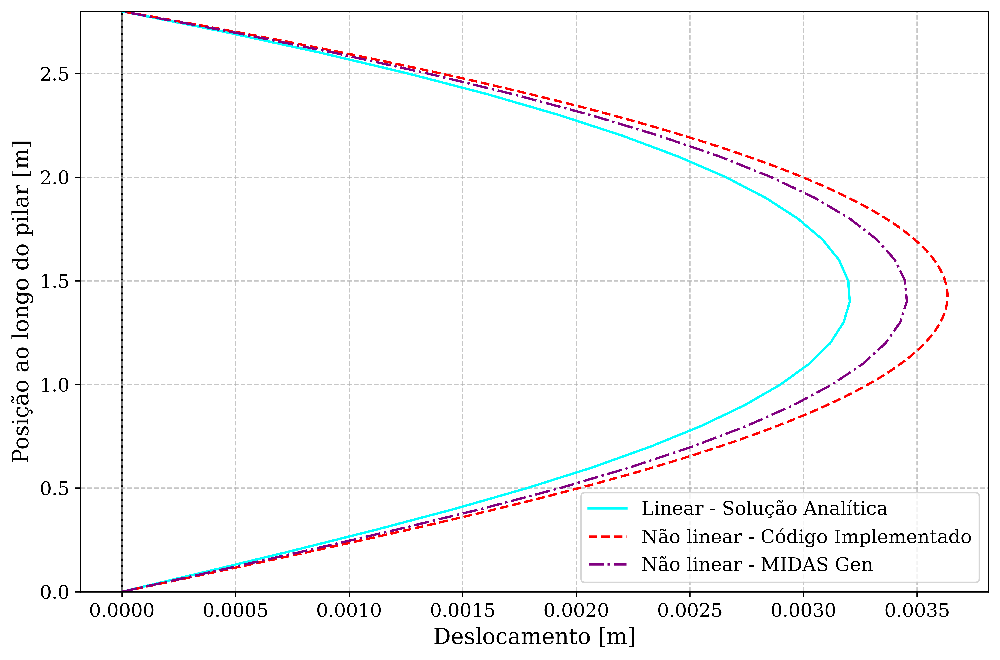

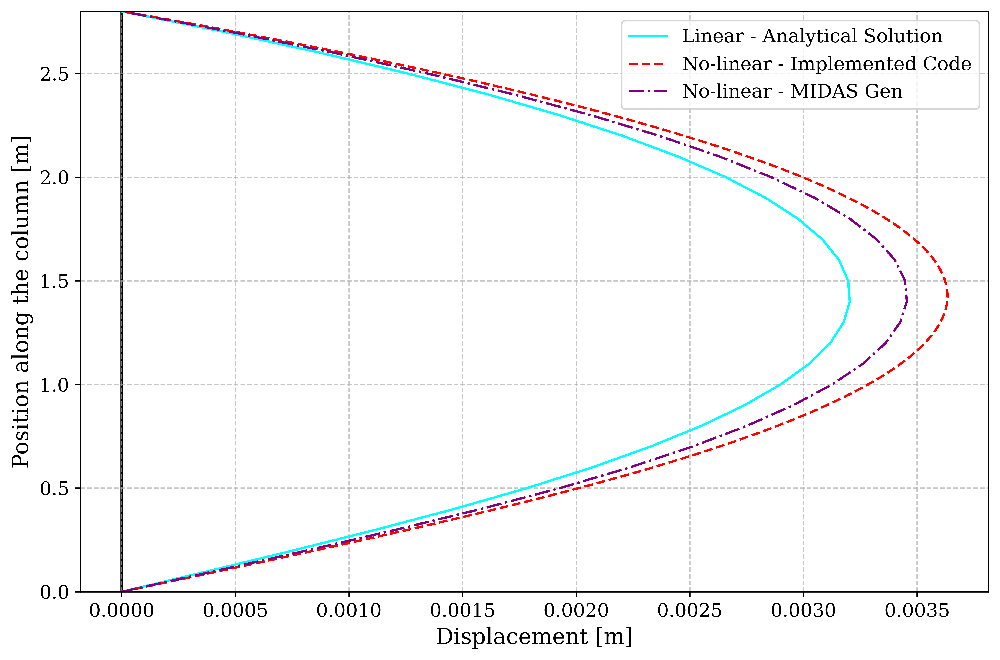

In [61]:
# Agrupamento dos dados para plotagem

data_pt    = [{'Z':      W_SOLUCANALIT, 'label': "Linear - Solução Analítica"},
              {'Z':              W_NLG, 'label': "Não linear - Código Implementado"},
              {'Z':   W_MIDASGEN_NLG, 'label': "Não linear - MIDAS Gen"},
             ]

data_en    = [{'Z':      W_SOLUCANALIT, 'label': "Linear - Analytical Solution"},
              {'Z':              W_NLG, 'label': "No-linear - Implemented Code"},
              {'Z':   W_MIDASGEN_NLG, 'label': "No-linear - MIDAS Gen"},
             ]


#Plotagem da Tabela com os deslocamentos máximos e mínimos
tabela_deslocamentos(data_pt)

#Plotagem do Gráfico
plot_deslocamentos(data_pt, L, language='pt')
plot_deslocamentos(data_en, L, language='en')



#### _Momento fletor ao longo do pilar_

In [ ]:
# Agrupamento dos dados para plotagem

data_pt    = [{'M':      M_SOLUCANALIT, 'label': "Linear - Solução Analítica"},
                   {'M':              M_NLG, 'label': "Não linear - Código Implementado"},
                   {'M':   M_MIDASGEN_NLG, 'label': "Não linear - MIDAS Gen"}
                  ]

data_en    = [{'M':      M_SOLUCANALIT, 'label': "Linear - Analytical Solution"},
                   {'M':              M_NLG, 'label': "No-linear - Implemented Code"},
                   {'M':   M_MIDASGEN_NLG, 'label': "No-linear - MIDAS Gen"}
                  ]

#Plotagem da Tabela com os Momentos Fletores máximos e mínimos
tabela_momentos_fletores(data_pt)

#Plotagem do Gráfico
plot_momentos_fletores(data_pt, L, language='pt')
plot_momentos_fletores(data_en, L, language='en')



#### _Fator de Segurança de Impacto_


In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Gerar Tabela
df_final = tabela_fs(M_NLG_NLF*1.1, M_values_85[-1])

# Exibindo
print('Momento Fletor Resistente:',M_values_85[-1], 'kN.m')
print(df_final)

# Plotar gráfico
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='pt')
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='en')

### EX. 2 - Pilar Biapoiado - 100kN - Cappellari, 2023

#### _Diagrama N, M, 1/r_

In [ ]:
# Agrupamento dos dados para plotagem
data = { '0.85 fcd - Implemented Code': (χ_values_85, M_values_85),
         '1.1 fcd - Implemented Code': (χ_values_11, M_values_11),
         }

#Plotagem do Gráfico
plot_Momento_curvatura(data, language='en')

#### _Diagrama M x EIef_

In [ ]:
# Ajustando a Dimensão do Vetor Rigidez para Plotagem
EIef=EIef[0]*np.ones_like(M_NLG)

# Agrupamento dos dados para plotagem
data = {
    'M_LINEAR e EIef': (M_P0, EIef),
    'M_NLG_NLF e EIef_NL': (M_NLG_NLF, EIef_NL_final),
}

#Plotagem do Gráfico
plot_Momento_vs_Rigidez(data, language='en')

#### _Deslocamento ao longo do pilar_

In [ ]:
# Agrupamento dos dados para plotagem
data_pt    = [{'Z':               W_P0, 'label': "LG & LF - Código Implementado"},
              {'Z':              W_NLG, 'label': "NLG & LF - Código Implementado"},
              {'Z':          W_NLG_NLF, 'label': "NLG & NLF - Código Implementado"}
             ]

#Plotagem da Tabela com os deslocamentos máximos e mínimos
tabela_deslocamentos(data_pt)

#Plotagem do Gráfico
plot_deslocamentos(data_pt, L, language='pt')

#### _Momento fletor ao longo do pilar_

Curvas                                   |   MF. Máx. |    MF Mín.
-----------------------------------------------------------------
NLG & NLF - Código Implementado          |  49.788407 |   0.000000
PP c/ 1/r aprox. - TQS                   |  53.100000 |   0.000000
P-Δ - TQS                                |  32.900000 |   0.000000
-----------------------------------------------------------------
                                         |       kN.m |       kN.m


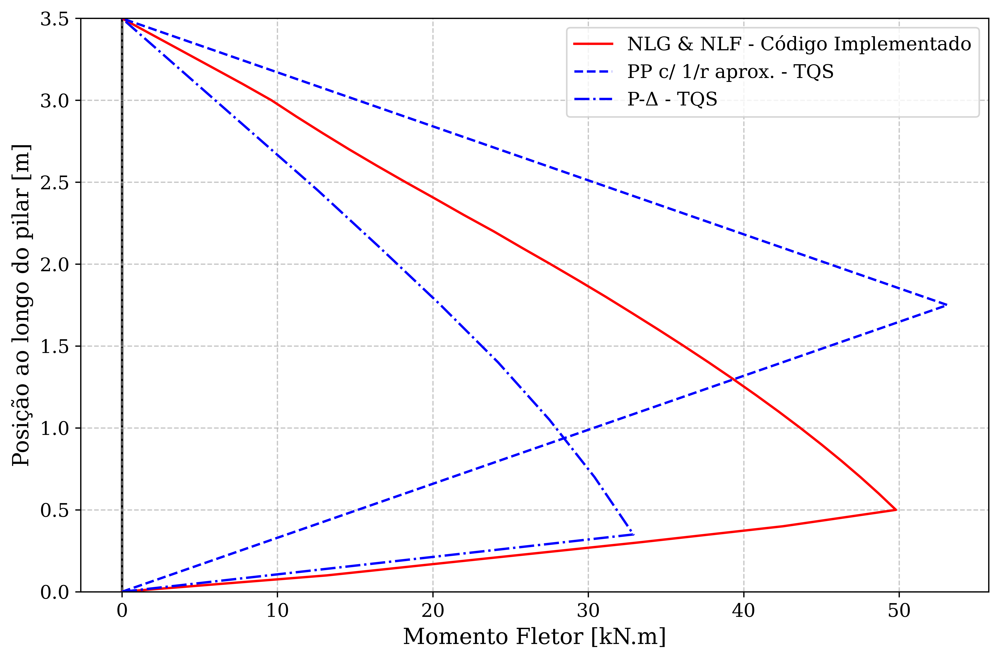

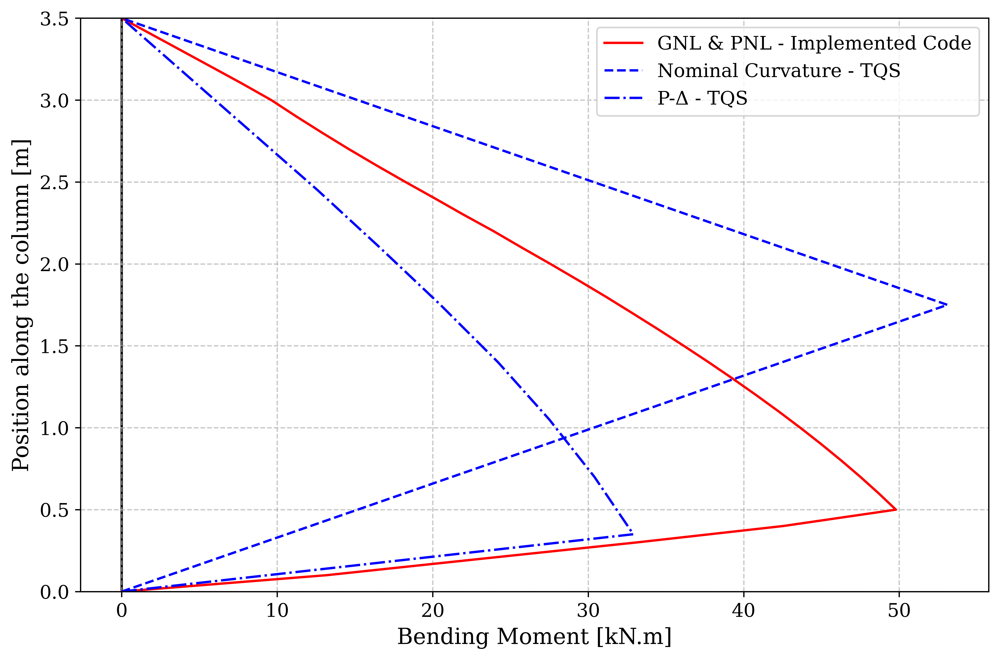

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Agrupamento dos dados para plotagem
data_pt = [{'M':      1.1*M_NLG_NLF, 'label': "NLG & NLF - Código Implementado"},
           {'M':         M_TQS_PP1r, 'label': "PP c/ 1/r aprox. - TQS"},
           {'M':       M_TQS_Pdelta, 'label': "P-Δ - TQS"}
          ]

data_en = [{'M':      1.1*M_NLG_NLF, 'label': "GNL & PNL - Implemented Code"},
           {'M':         M_TQS_PP1r, 'label': "Nominal Curvature - TQS"},
           {'M':       M_TQS_Pdelta, 'label': "P-Δ - TQS"}
          ]

#Plotagem da Tabela com os Momentos Fletores máximos e mínimos
tabela_momentos_fletores(data_pt)

#Plotagem do Gráfico
plot_momentos_fletores(data_pt, L, language='pt')
plot_momentos_fletores(data_en, L, language='en')

#### _Fator de Segurança de Impacto_

Momento Fletor Resistente: 65.10082120572778 kN.m
           z    Msd     F.S.
0   L (Topo)   0.00    (OK!)
1     0.97 L   1.94    33.52
2     0.94 L   3.88    16.77
3     0.91 L   5.82    11.18
4     0.89 L   7.76     8.39
5     0.86 L   9.62     6.77
6     0.83 L  11.23      5.8
7     0.80 L  12.90     5.05
8     0.77 L  14.62     4.45
9     0.74 L  16.41     3.97
10    0.71 L  18.25     3.57
11    0.69 L  20.14     3.23
12    0.66 L  21.99     2.96
13    0.63 L  23.91     2.72
14    0.60 L  25.72     2.53
15    0.57 L  27.57     2.36
16    0.54 L  29.37     2.22
17    0.51 L  31.13     2.09
18    0.49 L  32.83     1.98
19    0.46 L  34.51     1.89
20    0.43 L  36.15      1.8
21    0.40 L  37.74     1.72
22    0.37 L  39.29     1.66
23    0.34 L  40.79      1.6
24    0.31 L  42.24     1.54
25    0.29 L  43.64     1.49
26    0.26 L  44.98     1.45
27    0.23 L  46.27     1.41
28    0.20 L  47.50     1.37
29    0.17 L  48.68     1.34
30    0.14 L  49.79  1.31 ⚠️
31    0.11 L  42.53   

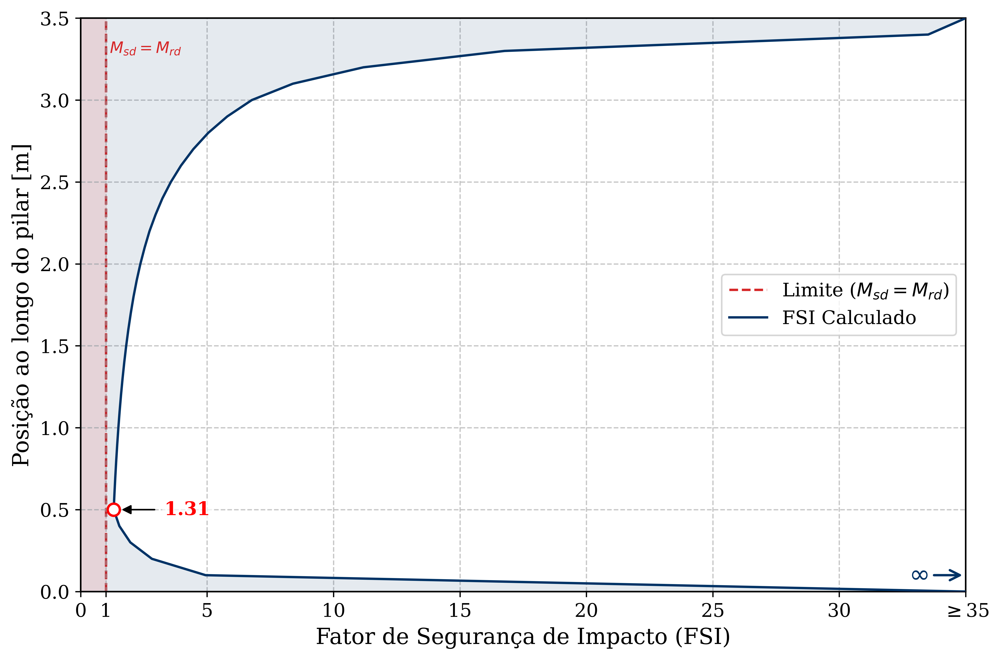

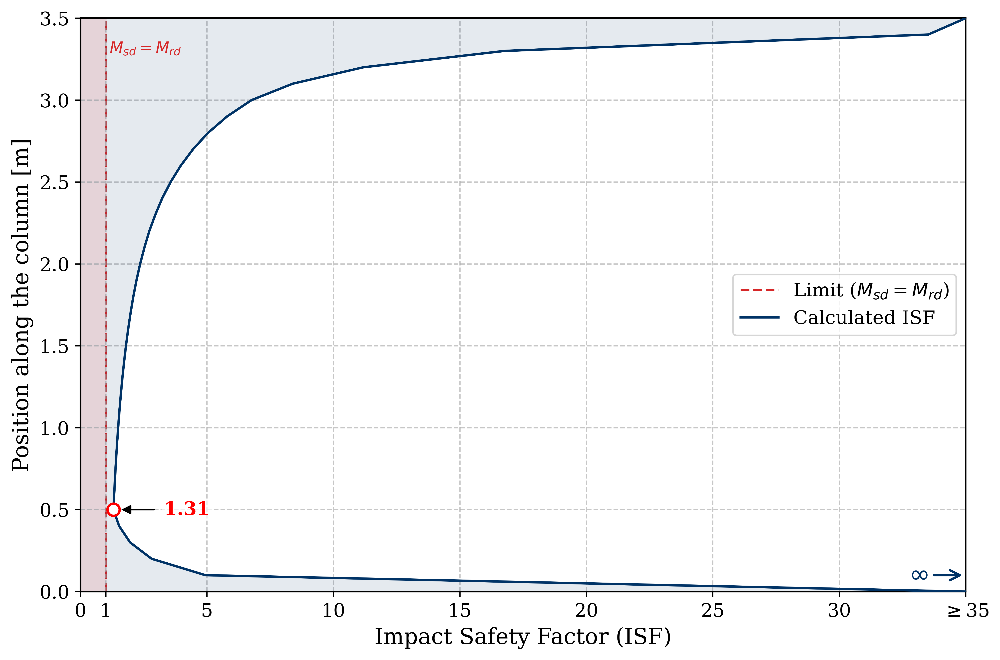

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Gerar Tabela
df_final = tabela_fs(M_NLG_NLF*1.1, M_values_85[-1])

# Exibindo
print('Momento Fletor Resistente:',M_values_85[-1], 'kN.m')
print(df_final)

# Plotar gráfico
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='pt')
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='en')

### EX. 3 - Pilar Biapoiado - 50kN - Cappellari, 2023

#### _Diagrama N, M, 1/r_

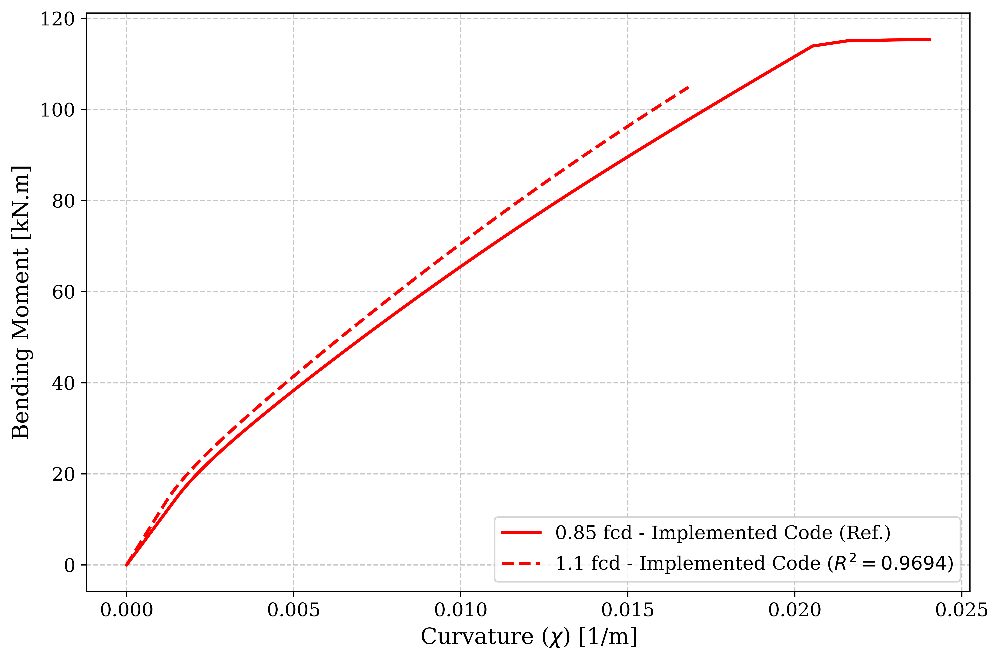

In [ ]:
# Agrupamento dos dados para plotagem
data = { '0.85 fcd - Implemented Code': (χ_values_85, M_values_85),
         '1.1 fcd - Implemented Code': (χ_values_11, M_values_11),

         }

#Plotagem do Gráfico
plot_Momento_curvatura(data, language='en')

#### _Diagrama M x EIef_

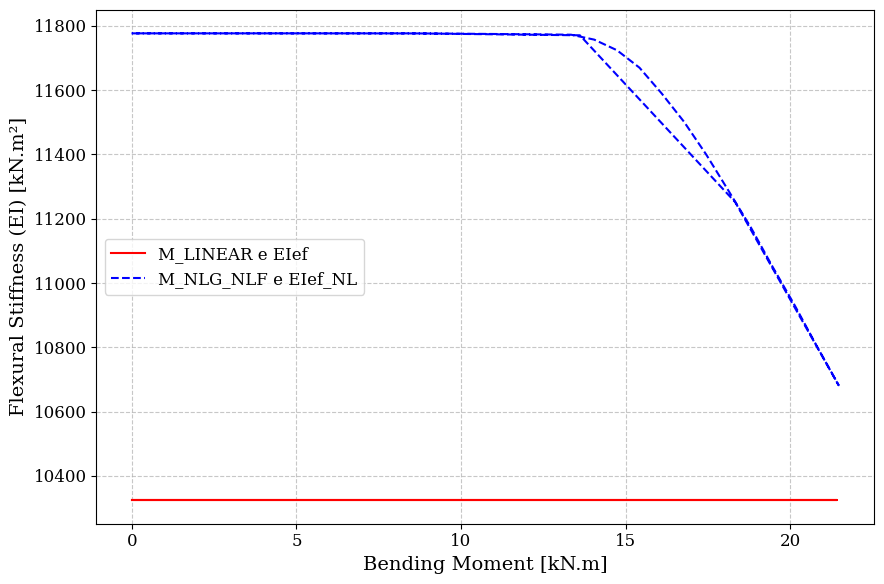

In [ ]:
# Ajustando a Dimensão do Vetor Rigidez para Plotagem
EIef=EIef[0]*np.ones_like(M_NLG)

# Agrupamento dos dados para plotagem
data = {
    'M_LINEAR e EIef': (M_P0, EIef),
    'M_NLG_NLF e EIef_NL': (M_NLG_NLF, EIef_NL_final),
}

#Plotagem do Gráfico
plot_Momento_vs_Rigidez(data, language='en')

#### _Deslocamento ao longo do pilar_

Curvas                                   | Desl. Máx. | Desl. Mín.
-----------------------------------------------------------------
LG & LF - Código Implementado            |   0.001847 |   0.000000
NLG & LF - Código Implementado           |   0.001920 |   0.000000
NLG & NLF - Código Implementado          |   0.001705 |   0.000000
-----------------------------------------------------------------
                                         |          m |          m


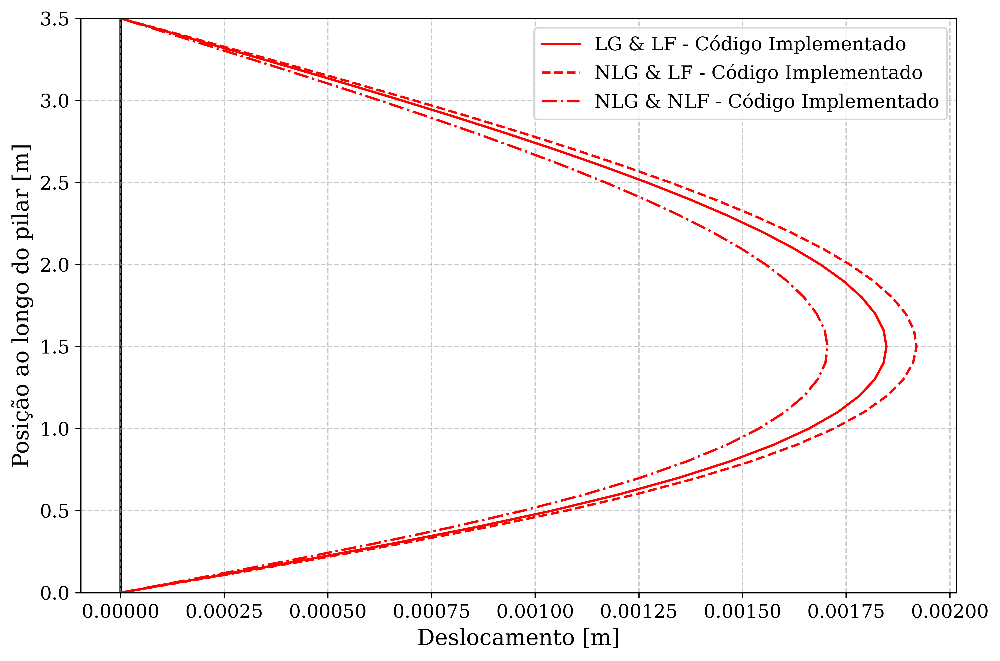

In [ ]:
# Agrupamento dos dados para plotagem
data_pt      = [{'Z':               W_P0, 'label': "LG & LF - Código Implementado"},
                {'Z':              W_NLG, 'label': "NLG & LF - Código Implementado"},
                {'Z':          W_NLG_NLF, 'label': "NLG & NLF - Código Implementado"}
                ]

#Plotagem da Tabela com os deslocamentos máximos e mínimos
tabela_deslocamentos(data_pt)

#Plotagem do Gráfico
plot_deslocamentos(data_pt, L, language='pt')

#### _Momento fletor ao longo do pilar_

Curvas                                   |   MF. Máx. |    MF Mín.
-----------------------------------------------------------------
NLG & NLF - Código Implementado          |  23.615330 |   0.000000
PP c/ 1/r aprox. - TQS                   |  27.900000 |   0.000000
P-Δ - TQS                                |  16.300000 |   0.000000
-----------------------------------------------------------------
                                         |       kN.m |       kN.m


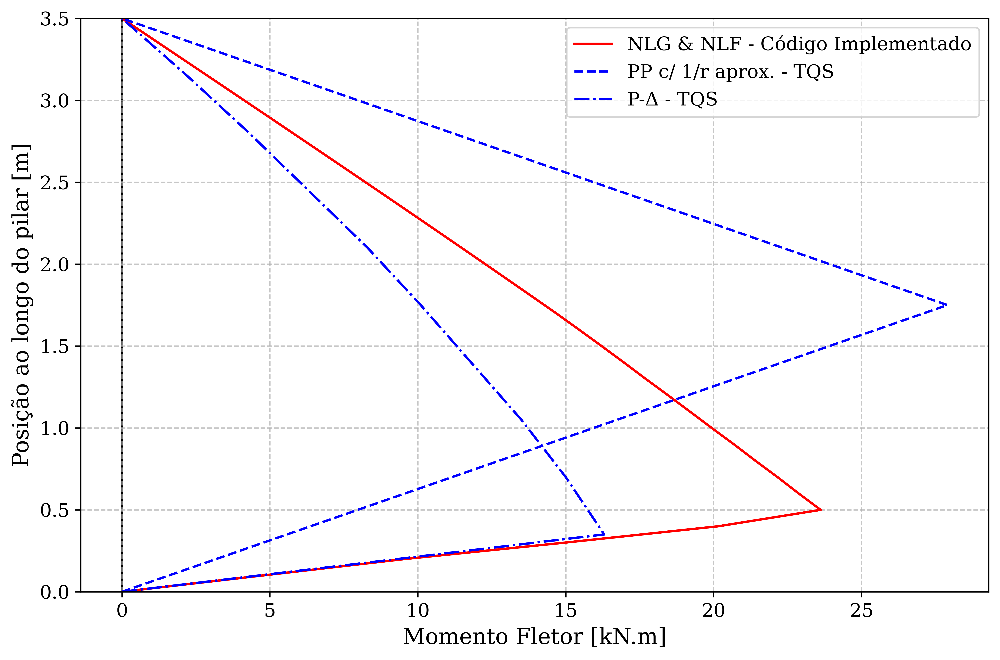

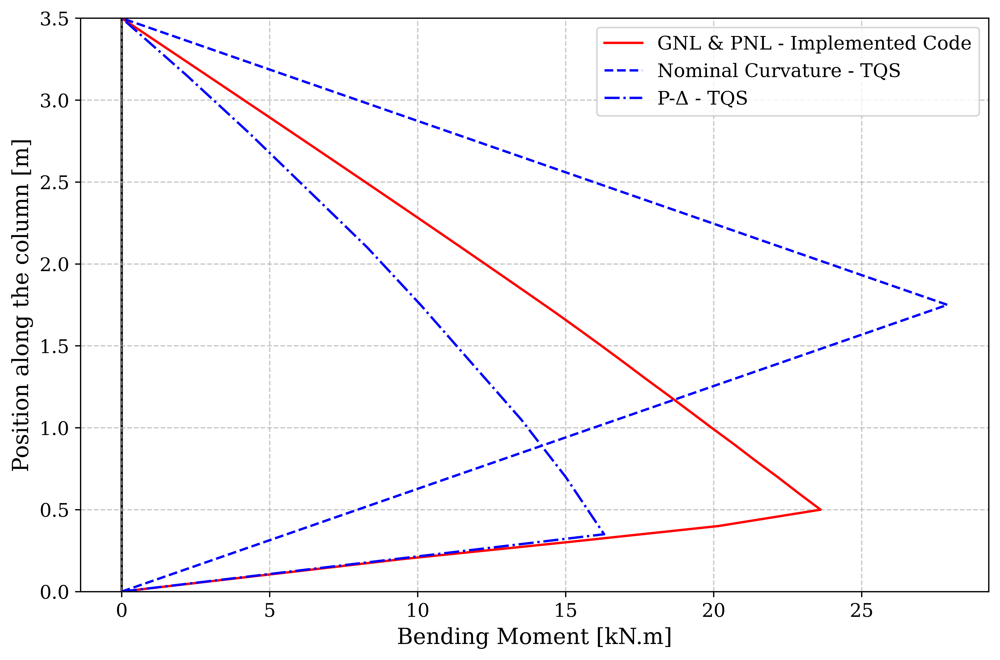

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Agrupamento dos dados para plotagem
data_pt = [{'M':      1.1*M_NLG_NLF, 'label': "NLG & NLF - Código Implementado"},
           {'M':         M_TQS_PP1r, 'label': "PP c/ 1/r aprox. - TQS"},
           {'M':       M_TQS_Pdelta, 'label': "P-Δ - TQS"}
          ]

data_en = [{'M':      1.1*M_NLG_NLF, 'label': "GNL & PNL - Implemented Code"},
           {'M':         M_TQS_PP1r, 'label': "Nominal Curvature - TQS"},
           {'M':       M_TQS_Pdelta, 'label': "P-Δ - TQS"}
          ]

#Plotagem da Tabela com os Momentos Fletores máximos e mínimos
tabela_momentos_fletores(data_pt)

#Plotagem do Gráfico
plot_momentos_fletores(data_pt, L, language='pt')
plot_momentos_fletores(data_en, L, language='en')

#### _Fator de Segurança de Impacto_

Momento Fletor Resistente: 115.38824836469567 kN.m
           z    Msd     F.S.
0   L (Topo)   0.00    (OK!)
1     0.97 L   0.83   139.65
2     0.94 L   1.65    69.83
3     0.91 L   2.48    46.56
4     0.89 L   3.30    34.93
5     0.86 L   4.13    27.96
6     0.83 L   4.95    23.31
7     0.80 L   5.77    19.99
8     0.77 L   6.59     17.5
9     0.74 L   7.41    15.57
10    0.71 L   8.23    14.02
11    0.69 L   9.04    12.76
12    0.66 L   9.86    11.71
13    0.63 L  10.67    10.82
14    0.60 L  11.48    10.06
15    0.57 L  12.28      9.4
16    0.54 L  13.08     8.82
17    0.51 L  13.88     8.31
18    0.49 L  14.68     7.86
19    0.46 L  15.45     7.47
20    0.43 L  16.21     7.12
21    0.40 L  16.96      6.8
22    0.37 L  17.70     6.52
23    0.34 L  18.45     6.25
24    0.31 L  19.20     6.01
25    0.29 L  19.93     5.79
26    0.26 L  20.68     5.58
27    0.23 L  21.41     5.39
28    0.20 L  22.16     5.21
29    0.17 L  22.88     5.04
30    0.14 L  23.62  4.89 ⚠️
31    0.11 L  20.16  

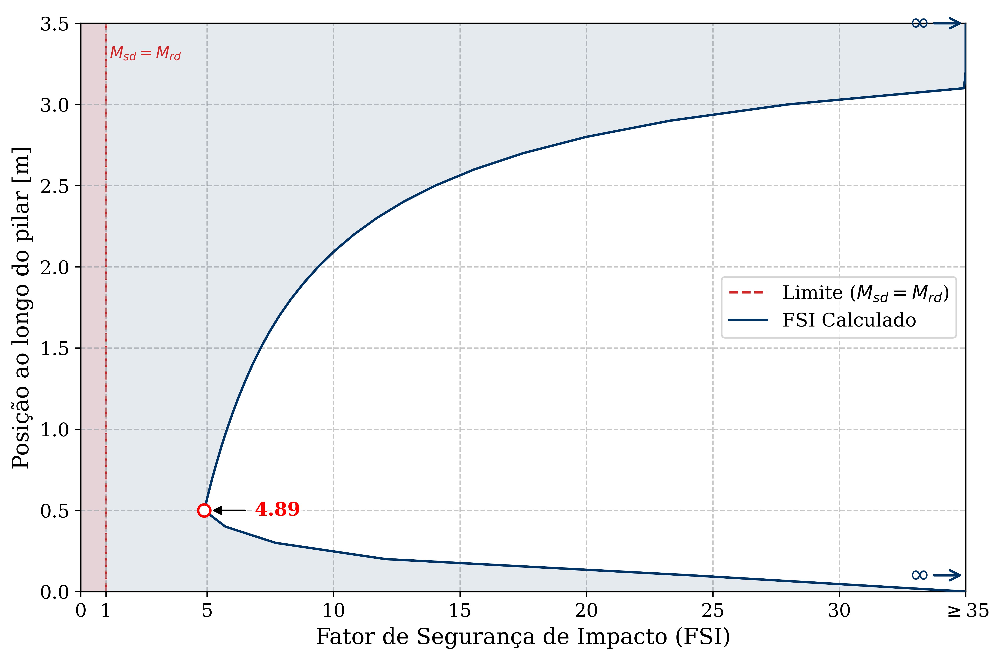

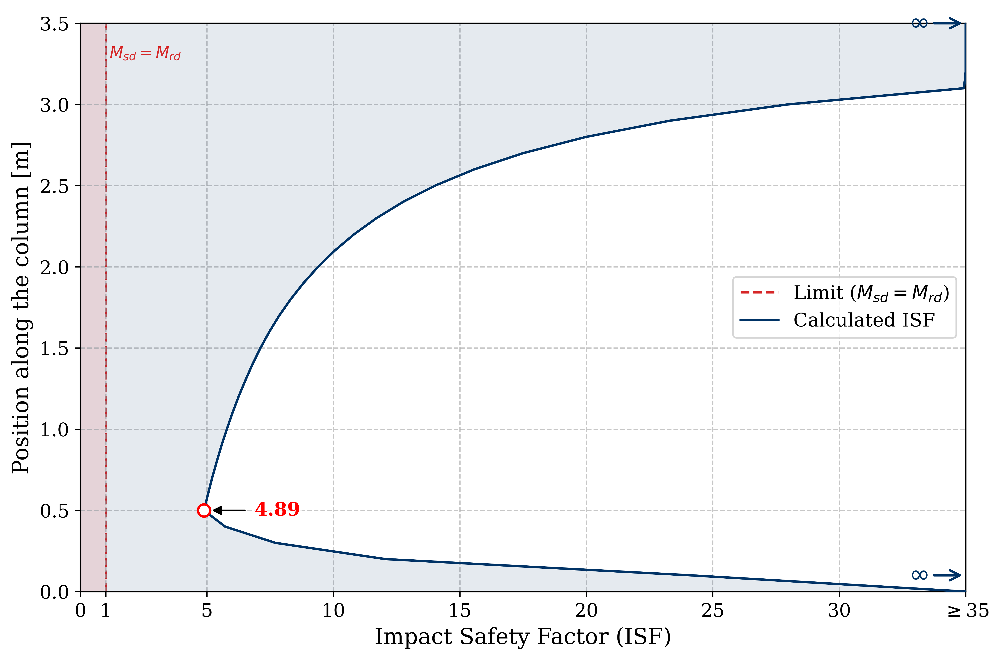

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Gerar Tabela
df_final = tabela_fs(M_NLG_NLF*1.1, M_values_85[-1])

# Exibindo
print('Momento Fletor Resistente:',M_values_85[-1], 'kN.m')
print(df_final)

# Plotar gráfico
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='pt')
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='en')

### EX. 4 - Pilar Biapoiado - 100kN - Edifício Proposto

#### _Diagrama N, M, 1/r_

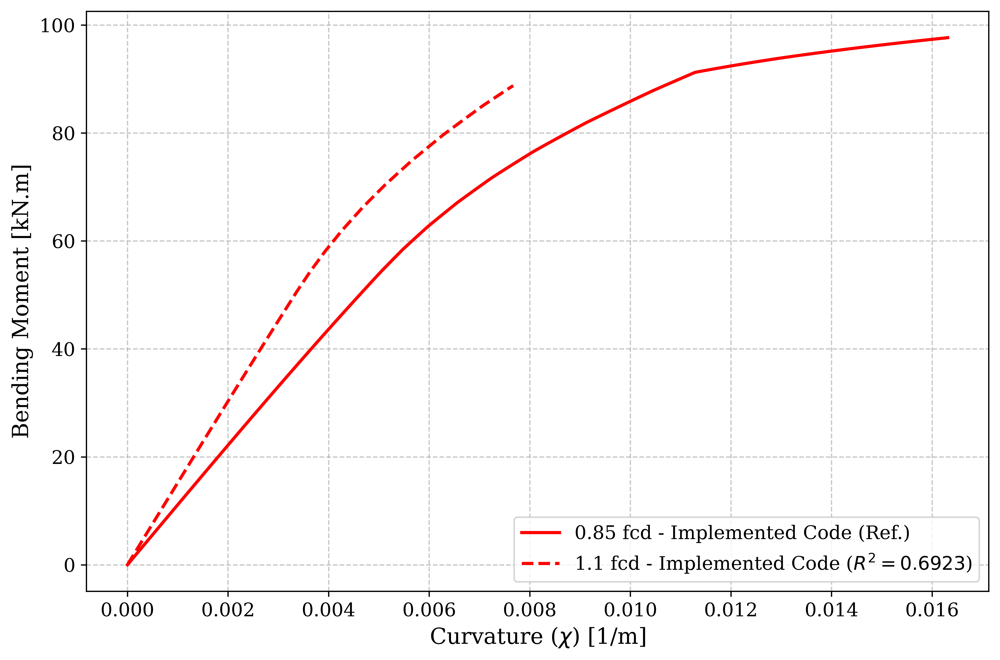

In [ ]:
# Agrupamento dos dados para plotagem
data = { '0.85 fcd - Implemented Code': (χ_values_85, M_values_85),
         '1.1 fcd - Implemented Code': (χ_values_11, M_values_11),
         }

#Plotagem do Gráfico
plot_Momento_curvatura(data, language='en')

#### _Diagrama M x EIef_

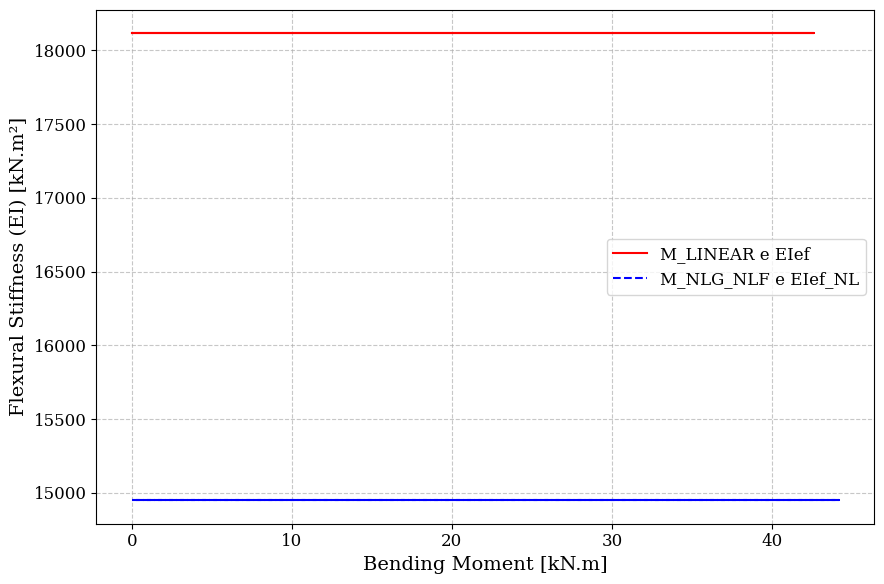

In [ ]:
# Ajustando a Dimensão do Vetor Rigidez para Plotagem
EIef=EIef[0]*np.ones_like(M_NLG)

# Agrupamento dos dados para plotagem
data = {
    'M_LINEAR e EIef': (M_P0, EIef),
    'M_NLG_NLF e EIef_NL': (M_NLG_NLF, EIef_NL_final),
}

#Plotagem do Gráfico
plot_Momento_vs_Rigidez(data, language='en')

#### _Deslocamento ao longo do pilar_

Curvas                                   | Desl. Máx. | Desl. Mín.
-----------------------------------------------------------------
LG & LF - Código Implementado            |   0.001982 |   0.000000
NLG & LF - Código Implementado           |   0.002137 |   0.000000
NLG & NLF - Código Implementado          |   0.002610 |   0.000000
-----------------------------------------------------------------
                                         |          m |          m


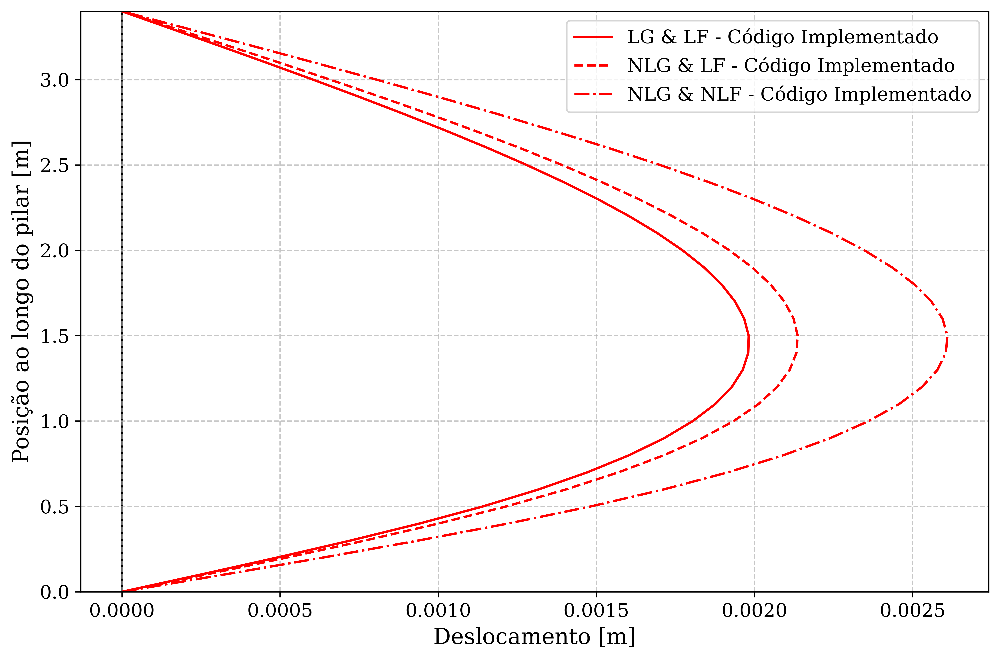

In [ ]:
# Agrupamento dos dados para plotagem
data_pt      = [{'Z':               W_P0, 'label': "LG & LF - Código Implementado"},
                {'Z':              W_NLG, 'label': "NLG & LF - Código Implementado"},
                {'Z':          W_NLG_NLF, 'label': "NLG & NLF - Código Implementado"}
                ]

#Plotagem da Tabela com os deslocamentos máximos e mínimos
tabela_deslocamentos(data_pt)

#Plotagem do Gráfico
plot_deslocamentos(data_pt, L, language='pt')

#### _Momento fletor ao longo do pilar_

Curvas                                   |   MF. Máx. |    MF Mín.
-----------------------------------------------------------------
NLG & NLF - Código Implementado          |  48.584134 |   0.000000
PP c/ 1/r aprox. - TQS                   |  43.000000 |   0.000000
P-Δ - TQS                                |  33.400000 |   0.000000
-----------------------------------------------------------------
                                         |       kN.m |       kN.m


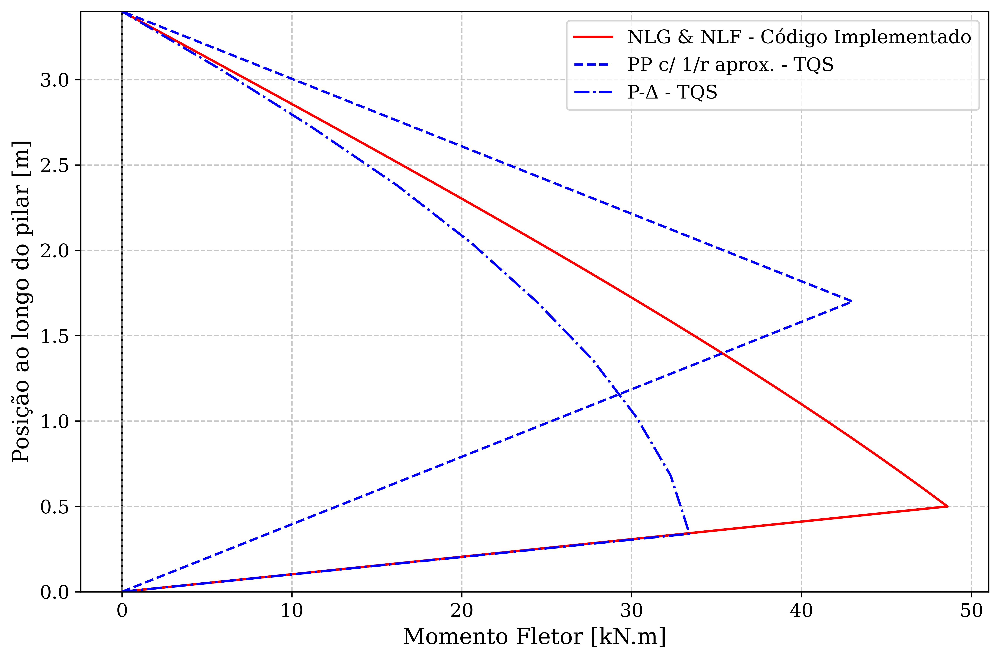

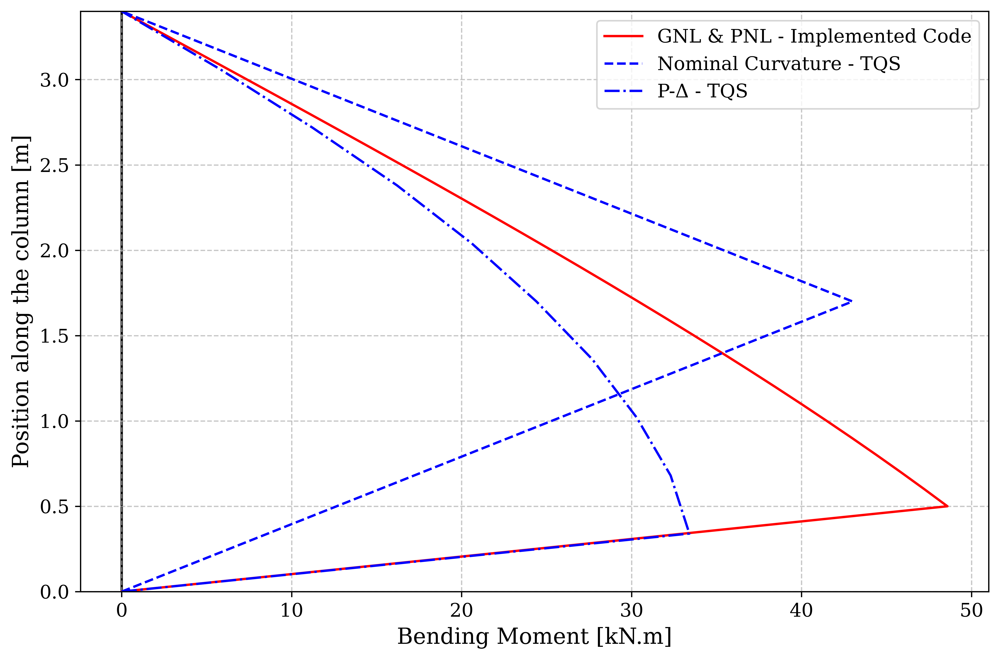

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Agrupamento dos dados para plotagem
data_pt = [{'M':      1.1*M_NLG_NLF, 'label': "NLG & NLF - Código Implementado"},
           {'M':         M_TQS_PP1r, 'label': "PP c/ 1/r aprox. - TQS"},
           {'M':       M_TQS_Pdelta, 'label': "P-Δ - TQS"}
          ]

data_en = [{'M':      1.1*M_NLG_NLF, 'label': "GNL & PNL - Implemented Code"},
           {'M':         M_TQS_PP1r, 'label': "Nominal Curvature - TQS"},
           {'M':       M_TQS_Pdelta, 'label': "P-Δ - TQS"}
          ]

#Plotagem da Tabela com os Momentos Fletores máximos e mínimos
tabela_momentos_fletores(data_pt)

#Plotagem do Gráfico
plot_momentos_fletores(data_pt, L, language='pt')
plot_momentos_fletores(data_en, L, language='en')

#### _Fator de Segurança de Impacto_

Momento Fletor Resistente: 97.66795208015489 kN.m
           z    Msd     F.S.
0   L (Topo)   0.00    (OK!)
1     0.97 L   1.85    52.86
2     0.94 L   3.69    26.44
3     0.91 L   5.54    17.64
4     0.88 L   7.38    13.24
5     0.85 L   9.21     10.6
6     0.82 L  11.04     8.85
7     0.79 L  12.86     7.59
8     0.76 L  14.68     6.66
9     0.74 L  16.48     5.93
10    0.71 L  18.27     5.35
11    0.68 L  20.05     4.87
12    0.65 L  21.81     4.48
13    0.62 L  23.56     4.15
14    0.59 L  25.30     3.86
15    0.56 L  27.01     3.62
16    0.53 L  28.71      3.4
17    0.50 L  30.39     3.21
18    0.47 L  32.04     3.05
19    0.44 L  33.68      2.9
20    0.41 L  35.29     2.77
21    0.38 L  36.88     2.65
22    0.35 L  38.44     2.54
23    0.32 L  39.98     2.44
24    0.29 L  41.49     2.35
25    0.26 L  42.97     2.27
26    0.24 L  44.42      2.2
27    0.21 L  45.84     2.13
28    0.18 L  47.23     2.07
29    0.15 L  48.58  2.01 ⚠️
30    0.12 L  38.91     2.51
31    0.09 L  29.20   

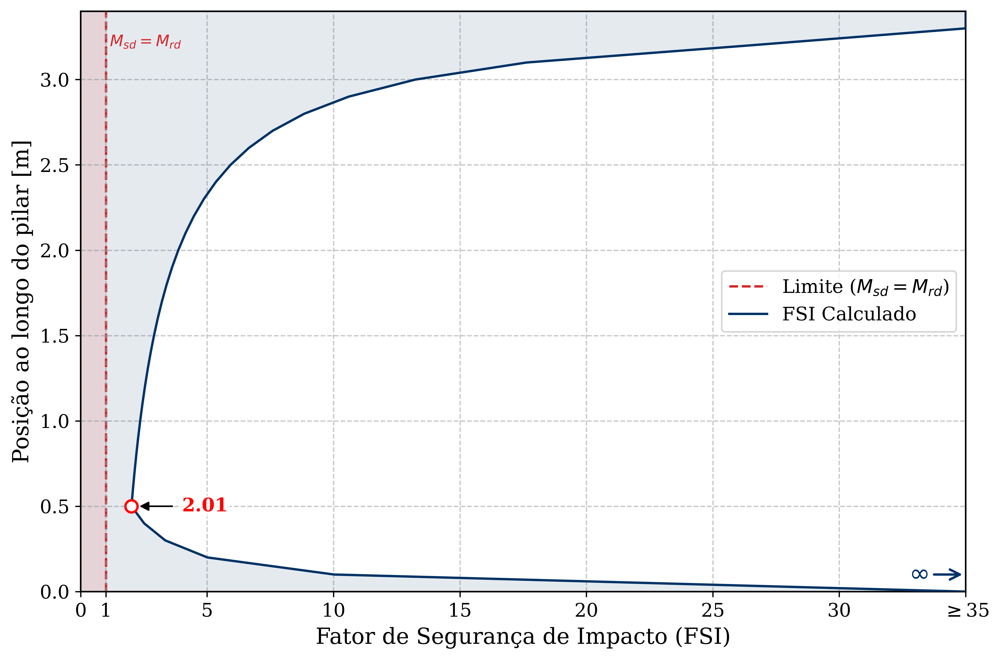

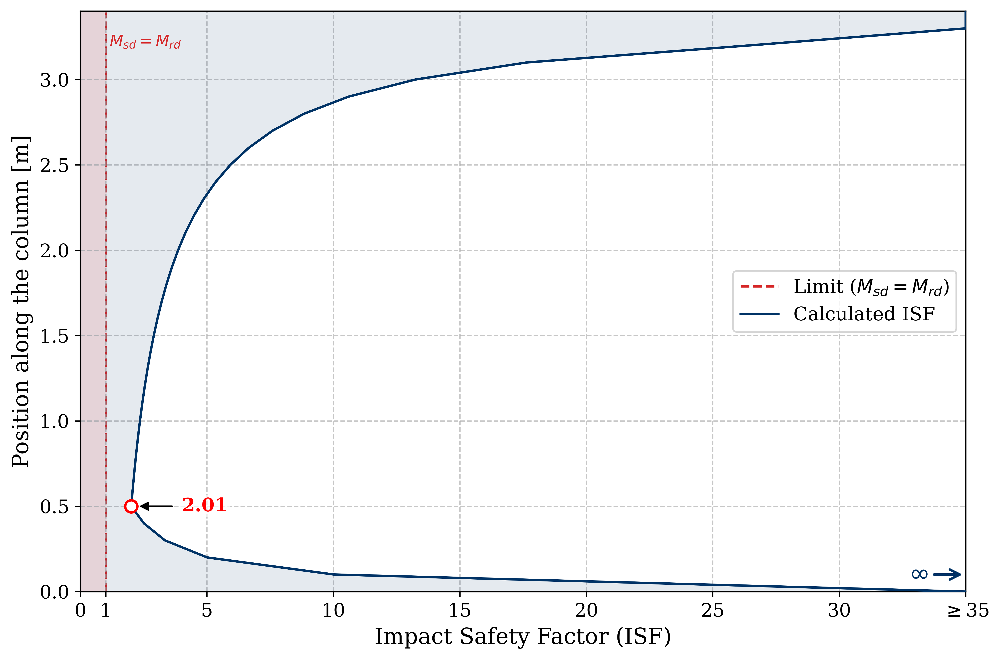

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Gerar Tabela
df_final = tabela_fs(M_NLG_NLF*1.1, M_values_85[-1])

# Exibindo
print('Momento Fletor Resistente:',M_values_85[-1], 'kN.m')
print(df_final)

# Plotar gráfico
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='pt')
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='en')

### EX. 5 - Pilar Biapoiado - 50kN - Edifício Proposto

#### _Diagrama N, M, 1/r_

In [ ]:
# Agrupamento dos dados para plotagem
data = { '0.85 fcd - Implemented Code': (χ_values_85, M_values_85),
         '1.1 fcd - Implemented Code': (χ_values_11, M_values_11),
         }

#Plotagem do Gráfico
plot_Momento_curvatura(data, language='en')

#### _Diagrama M x EIef_

In [ ]:
# Ajustando a Dimensão do Vetor Rigidez para Plotagem
EIef=EIef[0]*np.ones_like(M_NLG)

# Agrupamento dos dados para plotagem
data = {
    'M_LINEAR e EIef': (M_P0, EIef),
    'M_NLG_NLF e EIef_NL': (M_NLG_NLF, EIef_NL_final),
}

#Plotagem do Gráfico
plot_Momento_vs_Rigidez(data, language='en')

#### _Deslocamento ao longo do pilar_

In [ ]:
# Agrupamento dos dados para plotagem
data_pt      = [{'Z':               W_P0, 'label': "LG & LF - Código Implementado"},
                {'Z':              W_NLG, 'label': "NLG & LF - Código Implementado"},
                {'Z':          W_NLG_NLF, 'label': "NLG & NLF - Código Implementado"}
                ]

#Plotagem da Tabela com os deslocamentos máximos e mínimos
tabela_deslocamentos(data_pt)

#Plotagem do Gráfico
plot_deslocamentos(data_pt, L, language='pt')

#### _Momento fletor ao longo do pilar_

Curvas                                   |   MF. Máx. |    MF Mín.
-----------------------------------------------------------------
NLG & NLF - Código Implementado          |  13.538360 | -10.800000
PP c/ 1/r aprox. - TQS                   |  10.000000 | -75.200000
P-Δ - TQS                                |  10.000000 | -10.800000
-----------------------------------------------------------------
                                         |       kN.m |       kN.m


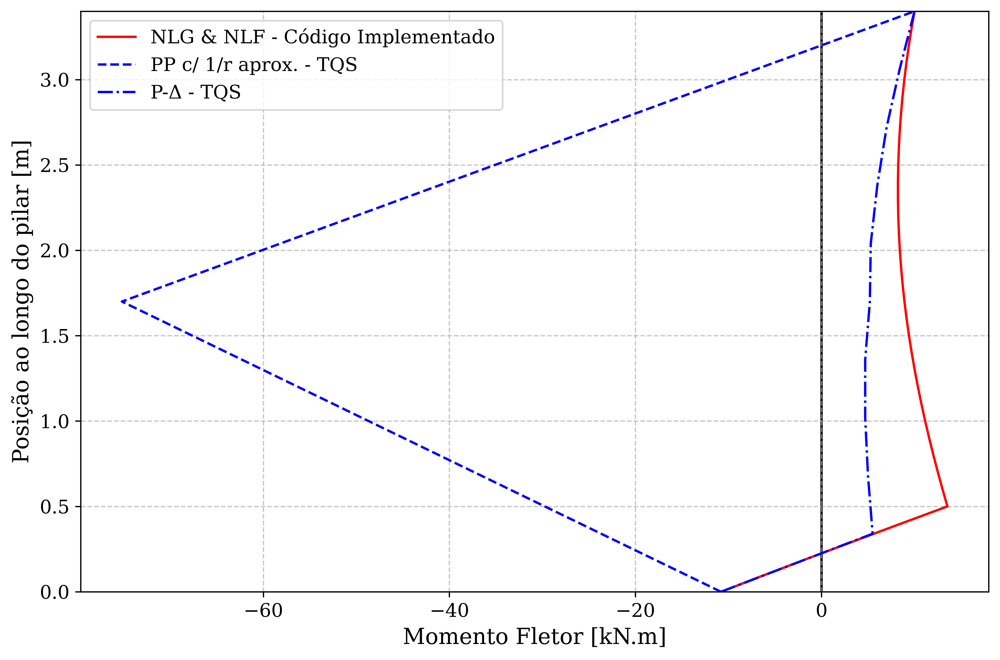

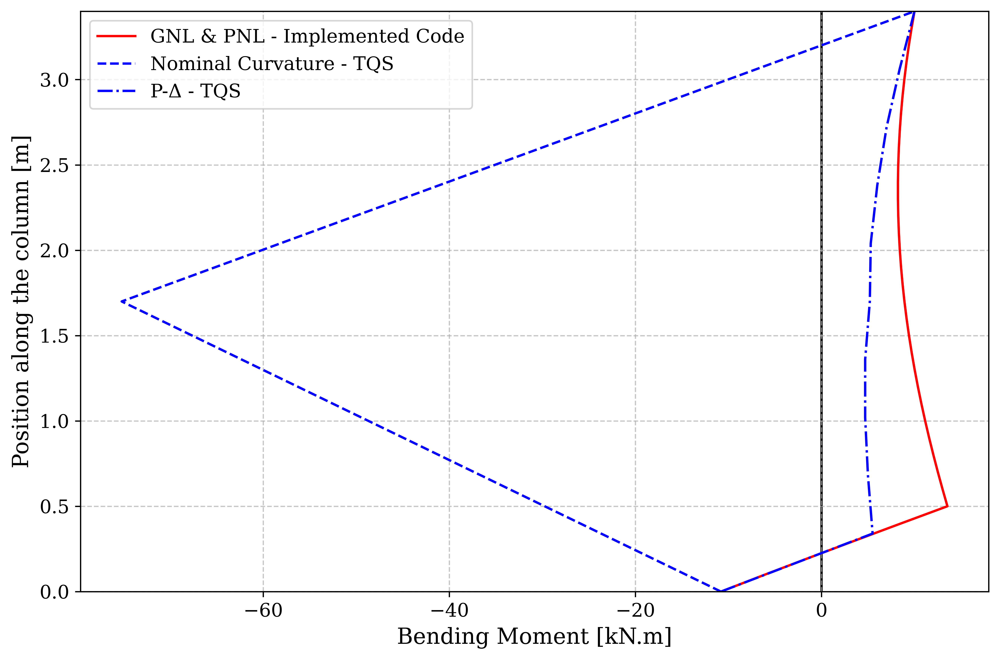

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Agrupamento dos dados para plotagem
data_pt = [{'M':      1.1*M_NLG_NLF, 'label': "NLG & NLF - Código Implementado"},
           {'M':         M_TQS_PP1r, 'label': "PP c/ 1/r aprox. - TQS"},
           {'M':       M_TQS_Pdelta, 'label': "P-Δ - TQS"}
          ]

data_en = [{'M':      1.1*M_NLG_NLF, 'label': "GNL & PNL - Implemented Code"},
           {'M':         M_TQS_PP1r, 'label': "Nominal Curvature - TQS"},
           {'M':       M_TQS_Pdelta, 'label': "P-Δ - TQS"}
          ]

#Plotagem da Tabela com os Momentos Fletores máximos e mínimos
tabela_momentos_fletores(data_pt)

#Plotagem do Gráfico
plot_momentos_fletores(data_pt, L, language='pt')
plot_momentos_fletores(data_en, L, language='en')

#### _Fator de Segurança de Impacto_

Momento Fletor Resistente: 97.66795208015489 kN.m
           z    Msd     F.S.
0   L (Topo)  10.00     9.77
1     0.97 L   9.68    10.09
2     0.94 L   9.39     10.4
3     0.91 L   9.13    10.69
4     0.88 L   8.91    10.96
5     0.85 L   8.71    11.21
6     0.82 L   8.55    11.43
7     0.79 L   8.42     11.6
8     0.76 L   8.32    11.74
9     0.74 L   8.25    11.83
10    0.71 L   8.22    11.88
11    0.68 L   8.22    11.88
12    0.65 L   8.26    11.83
13    0.62 L   8.32    11.73
14    0.59 L   8.42    11.59
15    0.56 L   8.56    11.41
16    0.53 L   8.72     11.2
17    0.50 L   8.92    10.95
18    0.47 L   9.15    10.68
19    0.44 L   9.41    10.38
20    0.41 L   9.70    10.07
21    0.38 L  10.02     9.75
22    0.35 L  10.37     9.42
23    0.32 L  10.74     9.09
24    0.29 L  11.15     8.76
25    0.26 L  11.58     8.44
26    0.24 L  12.03     8.12
27    0.21 L  12.51     7.81
28    0.18 L  13.01      7.5
29    0.15 L  13.54  7.21 ⚠️
30    0.12 L   8.58    11.38
31    0.09 L   3.66   

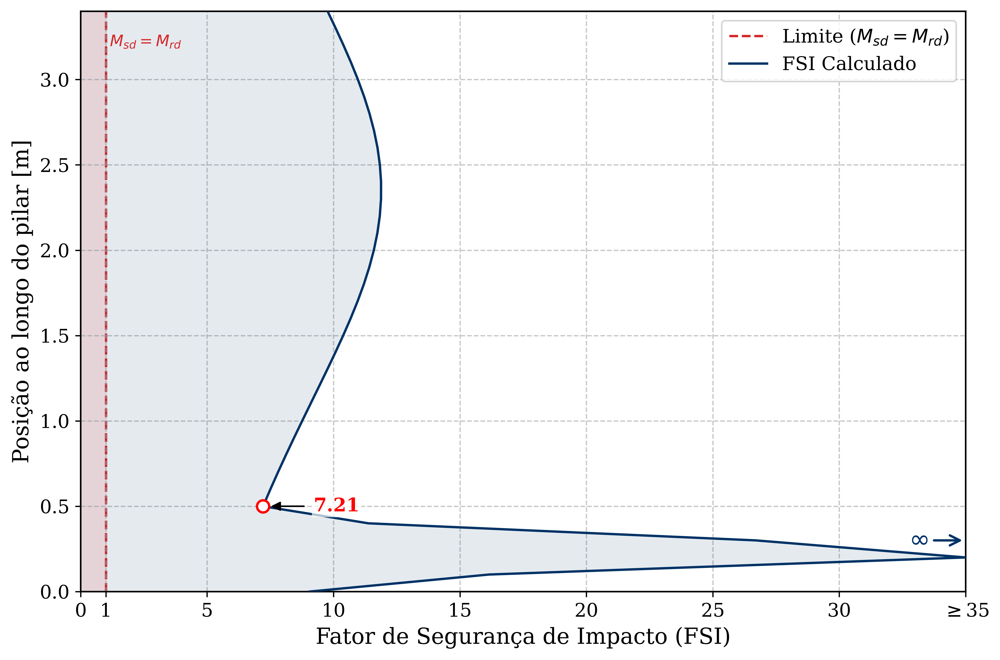

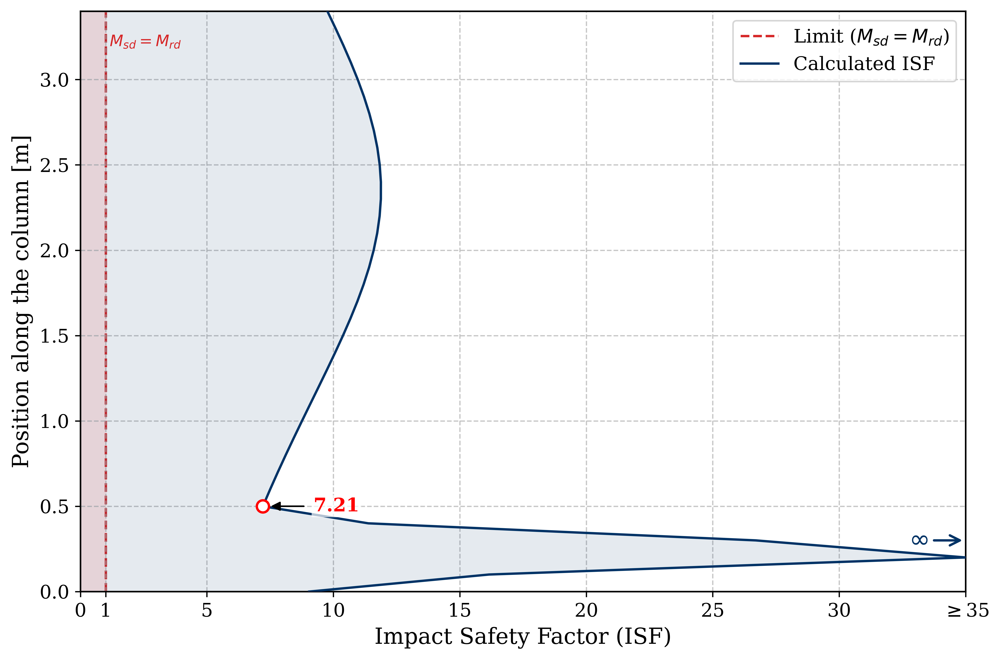

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Gerar Tabela
df_final = tabela_fs(M_NLG_NLF*1.1, M_values_85[-1])

# Exibindo
print('Momento Fletor Resistente:',M_values_85[-1], 'kN.m')
print(df_final)

# Plotar gráfico
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='pt')
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='en')

## **8.2 Seção Circular**

### EX. 1 - Pilar Engastado - sem impacto - Ferreira, 2017

#### _Diagrama N, M, 1/r_

In [ ]:
# Agrupamento dos dados para plotagem
data1_en = {
          '0.85 fcd - TQS': (χ_TQS_cir_85, M_TQS_cir_85 * 10),
          '0.85 fcd - Implemented Code': (χ_values_85, M_values_85),
          '0.85 fcd - Ferreira (2017)': (χ_FER_cir_85, M_FER_cir_85)
          }
data1_pt = {
          '0.85 fcd - TQS': (χ_TQS_cir_85, M_TQS_cir_85 * 10),
          '0.85 fcd - Código Implementado': (χ_values_85, M_values_85),
          '0.85 fcd - Ferreira (2017)': (χ_FER_cir_85, M_FER_cir_85)
          }

data2_en = {
          '1.1 fcd - TQS': (χ_TQS_cir_11, M_TQS_cir_11 * 10),
          '1.1 fcd - Implemented Code': (χ_values_11, M_values_11),
          '1.1 fcd - Ferreira (2017)': (χ_FER_cir_11, M_FER_cir_11)
          }
data2_pt = {
          '1.1 fcd - TQS': (χ_TQS_cir_11, M_TQS_cir_11 * 10),
          '1.1 fcd - Código Implementado': (χ_values_11, M_values_11),
          '1.1 fcd - Ferreira (2017)': (χ_FER_cir_11, M_FER_cir_11)
          }

#Plotagem do Gráfico
plot_Momento_curvatura(data1_pt, language='pt')
plot_Momento_curvatura(data2_pt, language='pt')

plot_Momento_curvatura(data1_en, language='en')
plot_Momento_curvatura(data2_en, language='en')

#### _Diagrama M x EIef_

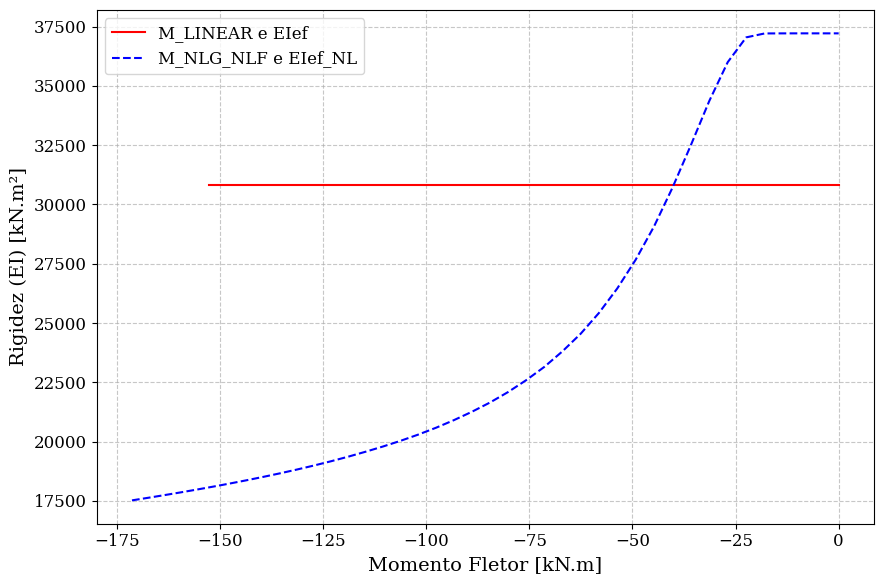

In [ ]:
# Ajustando a Dimensão do Vetor Rigidez para Plotagem
EIef=EIef[0]*np.ones_like(M_NLG)

# Agrupamento dos dados para plotagem
data_pt = {
    'M_LINEAR e EIef': (M_P0, EIef),
    'M_NLG_NLF e EIef_NL': (M_NLG_NLF, EIef_NL_final),
}

#Plotagem do Gráfico
plot_Momento_vs_Rigidez(data_pt, language='pt')

#### _Deslocamento ao longo do pilar_

In [ ]:
# Agrupamento dos dados para plotagem
data_pt      = [{'Z':     W_SOLUCANALIT, 'label': "LG & LF - Solução Analítica"},

                {'Z':              W_NLG, 'label': "NLG & LF - Código Implementado"},

                {'Z':          W_NLG_NLF, 'label': "NLG & NLF - Código Implementado"},
                {'Z':      W_FER_NLG_NLF, 'label': "NLG & NLF - Ferreira (2017)"},
                {'Z':    W_PCALC_NLG_NLF, 'label': "NLG & NLF - PCALC"}]

data_en      = [{'Z':      W_SOLUCANALIT, 'label': "GL & PL - Analytical Solution"},

                {'Z':              W_NLG, 'label': "GNL & PL - Implemented Code"},

                {'Z':          W_NLG_NLF, 'label': "GNL & PNL - Implemented Code"},
                {'Z':      W_FER_NLG_NLF, 'label': "GNL & PNL - Ferreira (2017)"},
                {'Z':    W_PCALC_NLG_NLF, 'label': "GNL & PNL - PCALC"}]

#Plotagem da Tabela com os deslocamentos máximos e mínimos
tabela_deslocamentos(data_pt)

#Plotagem do Gráfico
plot_deslocamentos(data_pt, L, language='pt')
plot_deslocamentos(data_en, L, language='en')


#### _Momento fletor ao longo do pilar_

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'

# Agrupamento dos dados para plotagem
data_pt      = [{'M':     M_SOLUCANALIT, 'label': "LG & LF - Solução Analítica"},

                {'M':              M_NLG, 'label': "NLG & LF - Código Implementado"},

                {'M':      M_NLG_NLF*1.1, 'label': "NLG & NLF - Código Implementado"},
                {'M':      M_FER_NLG_NLF, 'label': "NLG & NLF - Ferreira (2017)"},
                {'M':    M_PCALC_NLG_NLF, 'label': "NLG & NLF - PCALC"}]

data_en       = [{'M':     M_SOLUCANALIT, 'label': "GL & PL - Analytical Solution"},

                {'M':              M_NLG, 'label': "GNL & PL - Implemented Code"},

                {'M':      M_NLG_NLF*1.1, 'label': "GNL & PNL - Implemented Code"},
                {'M':      M_FER_NLG_NLF, 'label': "GNL & PNL - Ferreira (2017)"},
                {'M':    M_PCALC_NLG_NLF, 'label': "GNL & PNL - PCALC"}]


#Plotagem da Tabela com os Momentos Fletores máximos e mínimos
tabela_momentos_fletores(data_pt)

#Plotagem do Gráfico
plot_momentos_fletores(data_pt, L, language='pt')
plot_momentos_fletores(data_en, L, language='en')


#### _Fator de Segurança de Impacto_

In [ ]:
'Os esforços locais de 2ª ordem, conforme o item 15.3.1 da ABNT NBR 6118, podem ser calculados com as'
'cargas majoradas por γf / γf3, que posteriormente são majoradas por γf3 = 1.1.'


# Gerar Tabela
df_final = tabela_fs(M_NLG_NLF*1.1, M_values_85[-1])

# Exibindo
print('Momento Fletor Resistente:',M_values_85[-1], 'kN.m')
print(df_final)

# Plotar gráfico
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='pt')
plot_fator_seguranca_final(M_NLG_NLF*1.1, M_values_85[-1], L,language='en')